In [ ]:
!pip install diffusers transformers accelerate

In [20]:
## ----------------------------------------------------------
# A SDXL pipeline can take unlimited weighted prompt
#
# Author: Andrew Zhu
# Github: https://github.com/xhinker
# Medium: https://medium.com/@xhinker
## -----------------------------------------------------------

import inspect
import os
from typing import Any, Callable, Dict, List, Optional, Tuple, Union

import PIL.Image
import torch
from transformers import CLIPTextModel, CLIPTextModelWithProjection, CLIPTokenizer

from diffusers import DiffusionPipeline, StableDiffusionXLPipeline
from diffusers.image_processor import PipelineImageInput, VaeImageProcessor
from diffusers.loaders import (
    FromSingleFileMixin,
    LoraLoaderMixin,
    TextualInversionLoaderMixin,
)
from diffusers.models import AutoencoderKL, UNet2DConditionModel
from diffusers.models.attention_processor import (
    AttnProcessor2_0,
    LoRAAttnProcessor2_0,
    LoRAXFormersAttnProcessor,
    XFormersAttnProcessor,
)
from diffusers.pipelines.stable_diffusion_xl.pipeline_output import (
    StableDiffusionXLPipelineOutput,
)
from diffusers.schedulers import KarrasDiffusionSchedulers
from diffusers.utils import (
    is_accelerate_available,
    is_accelerate_version,
    is_invisible_watermark_available,
    logging,
    replace_example_docstring,
)
from diffusers.utils.torch_utils import randn_tensor


if is_invisible_watermark_available():
    from diffusers.pipelines.stable_diffusion_xl.watermark import (
        StableDiffusionXLWatermarker,
    )


def parse_prompt_attention(text):
    """
    Parses a string with attention tokens and returns a list of pairs: text and its associated weight.
    Accepted tokens are:
      (abc) - increases attention to abc by a multiplier of 1.1
      (abc:3.12) - increases attention to abc by a multiplier of 3.12
      [abc] - decreases attention to abc by a multiplier of 1.1
      \\( - literal character '('
      \\[ - literal character '['
      \\) - literal character ')'
      \\] - literal character ']'
      \\ - literal character '\'
      anything else - just text

    >>> parse_prompt_attention('normal text')
    [['normal text', 1.0]]
    >>> parse_prompt_attention('an (important) word')
    [['an ', 1.0], ['important', 1.1], [' word', 1.0]]
    >>> parse_prompt_attention('(unbalanced')
    [['unbalanced', 1.1]]
    >>> parse_prompt_attention('\\(literal\\]')
    [['(literal]', 1.0]]
    >>> parse_prompt_attention('(unnecessary)(parens)')
    [['unnecessaryparens', 1.1]]
    >>> parse_prompt_attention('a (((house:1.3)) [on] a (hill:0.5), sun, (((sky))).')
    [['a ', 1.0],
     ['house', 1.5730000000000004],
     [' ', 1.1],
     ['on', 1.0],
     [' a ', 1.1],
     ['hill', 0.55],
     [', sun, ', 1.1],
     ['sky', 1.4641000000000006],
     ['.', 1.1]]
    """
    import re

    re_attention = re.compile(
        r"""
            \\\(|\\\)|\\\[|\\]|\\\\|\\|\(|\[|:([+-]?[.\d]+)\)|
            \)|]|[^\\()\[\]:]+|:
        """,
        re.X,
    )

    re_break = re.compile(r"\s*\bBREAK\b\s*", re.S)

    res = []
    round_brackets = []
    square_brackets = []

    round_bracket_multiplier = 1.1
    square_bracket_multiplier = 1 / 1.1

    def multiply_range(start_position, multiplier):
        for p in range(start_position, len(res)):
            res[p][1] *= multiplier

    for m in re_attention.finditer(text):
        text = m.group(0)
        weight = m.group(1)

        if text.startswith("\\"):
            res.append([text[1:], 1.0])
        elif text == "(":
            round_brackets.append(len(res))
        elif text == "[":
            square_brackets.append(len(res))
        elif weight is not None and len(round_brackets) > 0:
            multiply_range(round_brackets.pop(), float(weight))
        elif text == ")" and len(round_brackets) > 0:
            multiply_range(round_brackets.pop(), round_bracket_multiplier)
        elif text == "]" and len(square_brackets) > 0:
            multiply_range(square_brackets.pop(), square_bracket_multiplier)
        else:
            parts = re.split(re_break, text)
            for i, part in enumerate(parts):
                if i > 0:
                    res.append(["BREAK", -1])
                res.append([part, 1.0])

    for pos in round_brackets:
        multiply_range(pos, round_bracket_multiplier)

    for pos in square_brackets:
        multiply_range(pos, square_bracket_multiplier)

    if len(res) == 0:
        res = [["", 1.0]]

    # merge runs of identical weights
    i = 0
    while i + 1 < len(res):
        if res[i][1] == res[i + 1][1]:
            res[i][0] += res[i + 1][0]
            res.pop(i + 1)
        else:
            i += 1

    return res


def get_prompts_tokens_with_weights(clip_tokenizer: CLIPTokenizer, prompt: str):
    """
    Get prompt token ids and weights, this function works for both prompt and negative prompt

    Args:
        pipe (CLIPTokenizer)
            A CLIPTokenizer
        prompt (str)
            A prompt string with weights

    Returns:
        text_tokens (list)
            A list contains token ids
        text_weight (list)
            A list contains the correspodent weight of token ids

    Example:
        import torch
        from transformers import CLIPTokenizer

        clip_tokenizer = CLIPTokenizer.from_pretrained(
            "stablediffusionapi/deliberate-v2"
            , subfolder = "tokenizer"
            , dtype = torch.float16
        )

        token_id_list, token_weight_list = get_prompts_tokens_with_weights(
            clip_tokenizer = clip_tokenizer
            ,prompt = "a (red:1.5) cat"*70
        )
    """
    texts_and_weights = parse_prompt_attention(prompt)
    text_tokens, text_weights = [], []
    for word, weight in texts_and_weights:
        # tokenize and discard the starting and the ending token
        token = clip_tokenizer(word, truncation=False).input_ids[
            1:-1
        ]  # so that tokenize whatever length prompt
        # the returned token is a 1d list: [320, 1125, 539, 320]

        # merge the new tokens to the all tokens holder: text_tokens
        text_tokens = [*text_tokens, *token]

        # each token chunk will come with one weight, like ['red cat', 2.0]
        # need to expand weight for each token.
        chunk_weights = [weight] * len(token)

        # append the weight back to the weight holder: text_weights
        text_weights = [*text_weights, *chunk_weights]
    return text_tokens, text_weights


def group_tokens_and_weights(token_ids: list, weights: list, pad_last_block=False):
    """
    Produce tokens and weights in groups and pad the missing tokens

    Args:
        token_ids (list)
            The token ids from tokenizer
        weights (list)
            The weights list from function get_prompts_tokens_with_weights
        pad_last_block (bool)
            Control if fill the last token list to 75 tokens with eos
    Returns:
        new_token_ids (2d list)
        new_weights (2d list)

    Example:
        token_groups,weight_groups = group_tokens_and_weights(
            token_ids = token_id_list
            , weights = token_weight_list
        )
    """
    bos, eos = 49406, 49407

    # this will be a 2d list
    new_token_ids = []
    new_weights = []
    while len(token_ids) >= 75:
        # get the first 75 tokens
        head_75_tokens = [token_ids.pop(0) for _ in range(75)]
        head_75_weights = [weights.pop(0) for _ in range(75)]

        # extract token ids and weights
        temp_77_token_ids = [bos] + head_75_tokens + [eos]
        temp_77_weights = [1.0] + head_75_weights + [1.0]

        # add 77 token and weights chunk to the holder list
        new_token_ids.append(temp_77_token_ids)
        new_weights.append(temp_77_weights)

    # padding the left
    if len(token_ids) > 0:
        padding_len = 75 - len(token_ids) if pad_last_block else 0

        temp_77_token_ids = [bos] + token_ids + [eos] * padding_len + [eos]
        new_token_ids.append(temp_77_token_ids)

        temp_77_weights = [1.0] + weights + [1.0] * padding_len + [1.0]
        new_weights.append(temp_77_weights)

    return new_token_ids, new_weights


def get_weighted_text_embeddings_sdxl(
    pipe: StableDiffusionXLPipeline,
    prompt: str = "",
    prompt_2: str = None,
    neg_prompt: str = "",
    neg_prompt_2: str = None,
    num_images_per_prompt: int = 1,
    device: Optional[torch.device] = None,
):
    """
    This function can process long prompt with weights, no length limitation
    for Stable Diffusion XL

    Args:
        pipe (StableDiffusionPipeline)
        prompt (str)
        prompt_2 (str)
        neg_prompt (str)
        neg_prompt_2 (str)
        num_images_per_prompt (int)
        device (torch.device)
    Returns:
        prompt_embeds (torch.Tensor)
        neg_prompt_embeds (torch.Tensor)
    """
    device = device or pipe._execution_device

    if prompt_2:
        prompt = f"{prompt} {prompt_2}"

    if neg_prompt_2:
        neg_prompt = f"{neg_prompt} {neg_prompt_2}"

    eos = pipe.tokenizer.eos_token_id

    # tokenizer 1
    prompt_tokens, prompt_weights = get_prompts_tokens_with_weights(
        pipe.tokenizer, prompt
    )

    neg_prompt_tokens, neg_prompt_weights = get_prompts_tokens_with_weights(
        pipe.tokenizer, neg_prompt
    )

    # tokenizer 2
    prompt_tokens_2, prompt_weights_2 = get_prompts_tokens_with_weights(
        pipe.tokenizer_2, prompt
    )

    neg_prompt_tokens_2, neg_prompt_weights_2 = get_prompts_tokens_with_weights(
        pipe.tokenizer_2, neg_prompt
    )

    # padding the shorter one for prompt set 1
    prompt_token_len = len(prompt_tokens)
    neg_prompt_token_len = len(neg_prompt_tokens)

    if prompt_token_len > neg_prompt_token_len:
        # padding the neg_prompt with eos token
        neg_prompt_tokens = neg_prompt_tokens + [eos] * abs(
            prompt_token_len - neg_prompt_token_len
        )
        neg_prompt_weights = neg_prompt_weights + [1.0] * abs(
            prompt_token_len - neg_prompt_token_len
        )
    else:
        # padding the prompt
        prompt_tokens = prompt_tokens + [eos] * abs(
            prompt_token_len - neg_prompt_token_len
        )
        prompt_weights = prompt_weights + [1.0] * abs(
            prompt_token_len - neg_prompt_token_len
        )

    # padding the shorter one for token set 2
    prompt_token_len_2 = len(prompt_tokens_2)
    neg_prompt_token_len_2 = len(neg_prompt_tokens_2)

    if prompt_token_len_2 > neg_prompt_token_len_2:
        # padding the neg_prompt with eos token
        neg_prompt_tokens_2 = neg_prompt_tokens_2 + [eos] * abs(
            prompt_token_len_2 - neg_prompt_token_len_2
        )
        neg_prompt_weights_2 = neg_prompt_weights_2 + [1.0] * abs(
            prompt_token_len_2 - neg_prompt_token_len_2
        )
    else:
        # padding the prompt
        prompt_tokens_2 = prompt_tokens_2 + [eos] * abs(
            prompt_token_len_2 - neg_prompt_token_len_2
        )
        prompt_weights_2 = prompt_weights + [1.0] * abs(
            prompt_token_len_2 - neg_prompt_token_len_2
        )

    embeds = []
    neg_embeds = []

    prompt_token_groups, prompt_weight_groups = group_tokens_and_weights(
        prompt_tokens.copy(), prompt_weights.copy()
    )

    neg_prompt_token_groups, neg_prompt_weight_groups = group_tokens_and_weights(
        neg_prompt_tokens.copy(), neg_prompt_weights.copy()
    )

    prompt_token_groups_2, prompt_weight_groups_2 = group_tokens_and_weights(
        prompt_tokens_2.copy(), prompt_weights_2.copy()
    )

    neg_prompt_token_groups_2, neg_prompt_weight_groups_2 = group_tokens_and_weights(
        neg_prompt_tokens_2.copy(), neg_prompt_weights_2.copy()
    )

    # get prompt embeddings one by one is not working.
    for i in range(len(prompt_token_groups)):
        # get positive prompt embeddings with weights
        token_tensor = torch.tensor(
            [prompt_token_groups[i]], dtype=torch.long, device=device
        )
        weight_tensor = torch.tensor(
            prompt_weight_groups[i], dtype=torch.float16, device=device
        )

        token_tensor_2 = torch.tensor(
            [prompt_token_groups_2[i]], dtype=torch.long, device=device
        )

        # use first text encoder
        prompt_embeds_1 = pipe.text_encoder(
            token_tensor.to(device), output_hidden_states=True
        )
        prompt_embeds_1_hidden_states = prompt_embeds_1.hidden_states[-2]

        # use second text encoder
        prompt_embeds_2 = pipe.text_encoder_2(
            token_tensor_2.to(device), output_hidden_states=True
        )
        prompt_embeds_2_hidden_states = prompt_embeds_2.hidden_states[-2]
        pooled_prompt_embeds = prompt_embeds_2[0]

        prompt_embeds_list = [
            prompt_embeds_1_hidden_states,
            prompt_embeds_2_hidden_states,
        ]
        token_embedding = torch.concat(prompt_embeds_list, dim=-1).squeeze(0)

        for j in range(len(weight_tensor)):
            if weight_tensor[j] != 1.0:
                token_embedding[j] = (
                    token_embedding[-1]
                    + (token_embedding[j] - token_embedding[-1]) * weight_tensor[j]
                )

        token_embedding = token_embedding.unsqueeze(0)
        embeds.append(token_embedding)

        # get negative prompt embeddings with weights
        neg_token_tensor = torch.tensor(
            [neg_prompt_token_groups[i]], dtype=torch.long, device=device
        )
        neg_token_tensor_2 = torch.tensor(
            [neg_prompt_token_groups_2[i]], dtype=torch.long, device=device
        )
        neg_weight_tensor = torch.tensor(
            neg_prompt_weight_groups[i], dtype=torch.float16, device=device
        )

        # use first text encoder
        neg_prompt_embeds_1 = pipe.text_encoder(
            neg_token_tensor.to(device), output_hidden_states=True
        )
        neg_prompt_embeds_1_hidden_states = neg_prompt_embeds_1.hidden_states[-2]

        # use second text encoder
        neg_prompt_embeds_2 = pipe.text_encoder_2(
            neg_token_tensor_2.to(device), output_hidden_states=True
        )
        neg_prompt_embeds_2_hidden_states = neg_prompt_embeds_2.hidden_states[-2]
        negative_pooled_prompt_embeds = neg_prompt_embeds_2[0]

        neg_prompt_embeds_list = [
            neg_prompt_embeds_1_hidden_states,
            neg_prompt_embeds_2_hidden_states,
        ]
        neg_token_embedding = torch.concat(neg_prompt_embeds_list, dim=-1).squeeze(0)

        for z in range(len(neg_weight_tensor)):
            if neg_weight_tensor[z] != 1.0:
                neg_token_embedding[z] = (
                    neg_token_embedding[-1]
                    + (neg_token_embedding[z] - neg_token_embedding[-1])
                    * neg_weight_tensor[z]
                )

        neg_token_embedding = neg_token_embedding.unsqueeze(0)
        neg_embeds.append(neg_token_embedding)

    prompt_embeds = torch.cat(embeds, dim=1)
    negative_prompt_embeds = torch.cat(neg_embeds, dim=1)

    bs_embed, seq_len, _ = prompt_embeds.shape
    # duplicate text embeddings for each generation per prompt, using mps friendly method
    prompt_embeds = prompt_embeds.repeat(1, num_images_per_prompt, 1)
    prompt_embeds = prompt_embeds.view(bs_embed * num_images_per_prompt, seq_len, -1)

    seq_len = negative_prompt_embeds.shape[1]
    negative_prompt_embeds = negative_prompt_embeds.repeat(1, num_images_per_prompt, 1)
    negative_prompt_embeds = negative_prompt_embeds.view(
        bs_embed * num_images_per_prompt, seq_len, -1
    )

    pooled_prompt_embeds = pooled_prompt_embeds.repeat(
        1, num_images_per_prompt, 1
    ).view(bs_embed * num_images_per_prompt, -1)
    negative_pooled_prompt_embeds = negative_pooled_prompt_embeds.repeat(
        1, num_images_per_prompt, 1
    ).view(bs_embed * num_images_per_prompt, -1)

    return (
        prompt_embeds,
        negative_prompt_embeds,
        pooled_prompt_embeds,
        negative_pooled_prompt_embeds,
    )


# -------------------------------------------------------------------------------------------------------------------------------
# reuse the backbone code from StableDiffusionXLPipeline
# -------------------------------------------------------------------------------------------------------------------------------

logger = logging.get_logger(__name__)  # pylint: disable=invalid-name

EXAMPLE_DOC_STRING = """
    Examples:
        ```py
        from diffusers import DiffusionPipeline
        import torch

        pipe = DiffusionPipeline.from_pretrained(
            "stabilityai/stable-diffusion-xl-base-1.0"
            , torch_dtype       = torch.float16
            , use_safetensors   = True
            , variant           = "fp16"
            , custom_pipeline   = "lpw_stable_diffusion_xl",
        )

        prompt = "a white cat running on the grass"*20
        prompt2 = "play a football"*20
        prompt = f"{prompt},{prompt2}"
        neg_prompt = "blur, low quality"

        pipe.to("cuda")
        images = pipe(
            prompt                  = prompt
            , negative_prompt       = neg_prompt
        ).images[0]

        pipe.to("cpu")
        torch.cuda.empty_cache()
        images
        ```
"""


# Copied from diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.rescale_noise_cfg
def rescale_noise_cfg(noise_cfg, noise_pred_text, guidance_rescale=0.0):
    """
    Rescale `noise_cfg` according to `guidance_rescale`. Based on findings of [Common Diffusion Noise Schedules and
    Sample Steps are Flawed](https://arxiv.org/pdf/2305.08891.pdf). See Section 3.4
    """
    std_text = noise_pred_text.std(
        dim=list(range(1, noise_pred_text.ndim)), keepdim=True
    )
    std_cfg = noise_cfg.std(dim=list(range(1, noise_cfg.ndim)), keepdim=True)
    # rescale the results from guidance (fixes overexposure)
    noise_pred_rescaled = noise_cfg * (std_text / std_cfg)
    # mix with the original results from guidance by factor guidance_rescale to avoid "plain looking" images
    noise_cfg = (
        guidance_rescale * noise_pred_rescaled + (1 - guidance_rescale) * noise_cfg
    )
    return noise_cfg


# Copied from diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion_img2img.retrieve_latents
def retrieve_latents(
    encoder_output: torch.Tensor,
    generator: Optional[torch.Generator] = None,
    sample_mode: str = "sample",
):
    if hasattr(encoder_output, "latent_dist") and sample_mode == "sample":
        return encoder_output.latent_dist.sample(generator)
    elif hasattr(encoder_output, "latent_dist") and sample_mode == "argmax":
        return encoder_output.latent_dist.mode()
    elif hasattr(encoder_output, "latents"):
        return encoder_output.latents
    else:
        raise AttributeError("Could not access latents of provided encoder_output")


# Copied from diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.retrieve_timesteps
def retrieve_timesteps(
    scheduler,
    num_inference_steps: Optional[int] = None,
    device: Optional[Union[str, torch.device]] = None,
    timesteps: Optional[List[int]] = None,
    **kwargs,
):
    """
    Calls the scheduler's `set_timesteps` method and retrieves timesteps from the scheduler after the call. Handles
    custom timesteps. Any kwargs will be supplied to `scheduler.set_timesteps`.

    Args:
        scheduler (`SchedulerMixin`):
            The scheduler to get timesteps from.
        num_inference_steps (`int`):
            The number of diffusion steps used when generating samples with a pre-trained model. If used,
            `timesteps` must be `None`.
        device (`str` or `torch.device`, *optional*):
            The device to which the timesteps should be moved to. If `None`, the timesteps are not moved.
        timesteps (`List[int]`, *optional*):
                Custom timesteps used to support arbitrary spacing between timesteps. If `None`, then the default
                timestep spacing strategy of the scheduler is used. If `timesteps` is passed, `num_inference_steps`
                must be `None`.

    Returns:
        `Tuple[torch.Tensor, int]`: A tuple where the first element is the timestep schedule from the scheduler and the
        second element is the number of inference steps.
    """
    if timesteps is not None:
        accepts_timesteps = "timesteps" in set(
            inspect.signature(scheduler.set_timesteps).parameters.keys()
        )
        if not accepts_timesteps:
            raise ValueError(
                f"The current scheduler class {scheduler.__class__}'s `set_timesteps` does not support custom"
                f" timestep schedules. Please check whether you are using the correct scheduler."
            )
        scheduler.set_timesteps(timesteps=timesteps, device=device, **kwargs)
        timesteps = scheduler.timesteps
        num_inference_steps = len(timesteps)
    else:
        scheduler.set_timesteps(num_inference_steps, device=device, **kwargs)
        timesteps = scheduler.timesteps
    return timesteps, num_inference_steps


class SDXLLongPromptWeightingPipeline(
    DiffusionPipeline, FromSingleFileMixin, LoraLoaderMixin
):
    r"""
    Pipeline for text-to-image generation using Stable Diffusion XL.

    This model inherits from [`DiffusionPipeline`]. Check the superclass documentation for the generic methods the
    library implements for all the pipelines (such as downloading or saving, running on a particular device, etc.)

    In addition the pipeline inherits the following loading methods:
        - *LoRA*: [`StableDiffusionXLPipeline.load_lora_weights`]
        - *Ckpt*: [`loaders.FromSingleFileMixin.from_single_file`]

    as well as the following saving methods:
        - *LoRA*: [`loaders.StableDiffusionXLPipeline.save_lora_weights`]

    Args:
        vae ([`AutoencoderKL`]):
            Variational Auto-Encoder (VAE) Model to encode and decode images to and from latent representations.
        text_encoder ([`CLIPTextModel`]):
            Frozen text-encoder. Stable Diffusion XL uses the text portion of
            [CLIP](https://huggingface.co/docs/transformers/model_doc/clip#transformers.CLIPTextModel), specifically
            the [clip-vit-large-patch14](https://huggingface.co/openai/clip-vit-large-patch14) variant.
        text_encoder_2 ([` CLIPTextModelWithProjection`]):
            Second frozen text-encoder. Stable Diffusion XL uses the text and pool portion of
            [CLIP](https://huggingface.co/docs/transformers/model_doc/clip#transformers.CLIPTextModelWithProjection),
            specifically the
            [laion/CLIP-ViT-bigG-14-laion2B-39B-b160k](https://huggingface.co/laion/CLIP-ViT-bigG-14-laion2B-39B-b160k)
            variant.
        tokenizer (`CLIPTokenizer`):
            Tokenizer of class
            [CLIPTokenizer](https://huggingface.co/docs/transformers/v4.21.0/en/model_doc/clip#transformers.CLIPTokenizer).
        tokenizer_2 (`CLIPTokenizer`):
            Second Tokenizer of class
            [CLIPTokenizer](https://huggingface.co/docs/transformers/v4.21.0/en/model_doc/clip#transformers.CLIPTokenizer).
        unet ([`UNet2DConditionModel`]): Conditional U-Net architecture to denoise the encoded image latents.
        scheduler ([`SchedulerMixin`]):
            A scheduler to be used in combination with `unet` to denoise the encoded image latents. Can be one of
            [`DDIMScheduler`], [`LMSDiscreteScheduler`], or [`PNDMScheduler`].
    """

    def __init__(
        self,
        vae: AutoencoderKL,
        text_encoder: CLIPTextModel,
        text_encoder_2: CLIPTextModelWithProjection,
        tokenizer: CLIPTokenizer,
        tokenizer_2: CLIPTokenizer,
        unet: UNet2DConditionModel,
        scheduler: KarrasDiffusionSchedulers,
        force_zeros_for_empty_prompt: bool = True,
        add_watermarker: Optional[bool] = None,
    ):
        super().__init__()

        self.register_modules(
            vae=vae,
            text_encoder=text_encoder,
            text_encoder_2=text_encoder_2,
            tokenizer=tokenizer,
            tokenizer_2=tokenizer_2,
            unet=unet,
            scheduler=scheduler,
        )
        self.register_to_config(
            force_zeros_for_empty_prompt=force_zeros_for_empty_prompt
        )
        self.vae_scale_factor = 2 ** (len(self.vae.config.block_out_channels) - 1)
        self.image_processor = VaeImageProcessor(vae_scale_factor=self.vae_scale_factor)
        self.mask_processor = VaeImageProcessor(
            vae_scale_factor=self.vae_scale_factor,
            do_normalize=False,
            do_binarize=True,
            do_convert_grayscale=True,
        )
        self.default_sample_size = self.unet.config.sample_size

        add_watermarker = (
            add_watermarker
            if add_watermarker is not None
            else is_invisible_watermark_available()
        )

        if add_watermarker:
            self.watermark = StableDiffusionXLWatermarker()
        else:
            self.watermark = None

    # Copied from diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline.enable_vae_slicing
    def enable_vae_slicing(self):
        r"""
        Enable sliced VAE decoding. When this option is enabled, the VAE will split the input tensor in slices to
        compute decoding in several steps. This is useful to save some memory and allow larger batch sizes.
        """
        self.vae.enable_slicing()

    # Copied from diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline.disable_vae_slicing
    def disable_vae_slicing(self):
        r"""
        Disable sliced VAE decoding. If `enable_vae_slicing` was previously enabled, this method will go back to
        computing decoding in one step.
        """
        self.vae.disable_slicing()

    # Copied from diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline.enable_vae_tiling
    def enable_vae_tiling(self):
        r"""
        Enable tiled VAE decoding. When this option is enabled, the VAE will split the input tensor into tiles to
        compute decoding and encoding in several steps. This is useful for saving a large amount of memory and to allow
        processing larger images.
        """
        self.vae.enable_tiling()

    # Copied from diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline.disable_vae_tiling
    def disable_vae_tiling(self):
        r"""
        Disable tiled VAE decoding. If `enable_vae_tiling` was previously enabled, this method will go back to
        computing decoding in one step.
        """
        self.vae.disable_tiling()

    def enable_model_cpu_offload(self, gpu_id=0):
        r"""
        Offloads all models to CPU using accelerate, reducing memory usage with a low impact on performance. Compared
        to `enable_sequential_cpu_offload`, this method moves one whole model at a time to the GPU when its `forward`
        method is called, and the model remains in GPU until the next model runs. Memory savings are lower than with
        `enable_sequential_cpu_offload`, but performance is much better due to the iterative execution of the `unet`.
        """
        if is_accelerate_available() and is_accelerate_version(">=", "0.17.0.dev0"):
            from accelerate import cpu_offload_with_hook
        else:
            raise ImportError(
                "`enable_model_cpu_offload` requires `accelerate v0.17.0` or higher."
            )

        device = torch.device(f"cuda:{gpu_id}")

        if self.device.type != "cpu":
            self.to("cpu", silence_dtype_warnings=True)
            torch.cuda.empty_cache()  # otherwise we don't see the memory savings (but they probably exist)

        model_sequence = (
            [self.text_encoder, self.text_encoder_2]
            if self.text_encoder is not None
            else [self.text_encoder_2]
        )
        model_sequence.extend([self.unet, self.vae])

        hook = None
        for cpu_offloaded_model in model_sequence:
            _, hook = cpu_offload_with_hook(
                cpu_offloaded_model, device, prev_module_hook=hook
            )

        # We'll offload the last model manually.
        self.final_offload_hook = hook

    def encode_prompt(
        self,
        prompt: str,
        prompt_2: Optional[str] = None,
        device: Optional[torch.device] = None,
        num_images_per_prompt: int = 1,
        do_classifier_free_guidance: bool = True,
        negative_prompt: Optional[str] = None,
        negative_prompt_2: Optional[str] = None,
        prompt_embeds: Optional[torch.FloatTensor] = None,
        negative_prompt_embeds: Optional[torch.FloatTensor] = None,
        pooled_prompt_embeds: Optional[torch.FloatTensor] = None,
        negative_pooled_prompt_embeds: Optional[torch.FloatTensor] = None,
        lora_scale: Optional[float] = None,
    ):
        r"""
        Encodes the prompt into text encoder hidden states.

        Args:
            prompt (`str` or `List[str]`, *optional*):
                prompt to be encoded
            prompt_2 (`str` or `List[str]`, *optional*):
                The prompt or prompts to be sent to the `tokenizer_2` and `text_encoder_2`. If not defined, `prompt` is
                used in both text-encoders
            device: (`torch.device`):
                torch device
            num_images_per_prompt (`int`):
                number of images that should be generated per prompt
            do_classifier_free_guidance (`bool`):
                whether to use classifier free guidance or not
            negative_prompt (`str` or `List[str]`, *optional*):
                The prompt or prompts not to guide the image generation. If not defined, one has to pass
                `negative_prompt_embeds` instead. Ignored when not using guidance (i.e., ignored if `guidance_scale` is
                less than `1`).
            negative_prompt_2 (`str` or `List[str]`, *optional*):
                The prompt or prompts not to guide the image generation to be sent to `tokenizer_2` and
                `text_encoder_2`. If not defined, `negative_prompt` is used in both text-encoders
            prompt_embeds (`torch.FloatTensor`, *optional*):
                Pre-generated text embeddings. Can be used to easily tweak text inputs, *e.g.* prompt weighting. If not
                provided, text embeddings will be generated from `prompt` input argument.
            negative_prompt_embeds (`torch.FloatTensor`, *optional*):
                Pre-generated negative text embeddings. Can be used to easily tweak text inputs, *e.g.* prompt
                weighting. If not provided, negative_prompt_embeds will be generated from `negative_prompt` input
                argument.
            pooled_prompt_embeds (`torch.FloatTensor`, *optional*):
                Pre-generated pooled text embeddings. Can be used to easily tweak text inputs, *e.g.* prompt weighting.
                If not provided, pooled text embeddings will be generated from `prompt` input argument.
            negative_pooled_prompt_embeds (`torch.FloatTensor`, *optional*):
                Pre-generated negative pooled text embeddings. Can be used to easily tweak text inputs, *e.g.* prompt
                weighting. If not provided, pooled negative_prompt_embeds will be generated from `negative_prompt`
                input argument.
            lora_scale (`float`, *optional*):
                A lora scale that will be applied to all LoRA layers of the text encoder if LoRA layers are loaded.
        """
        device = device or self._execution_device

        # set lora scale so that monkey patched LoRA
        # function of text encoder can correctly access it
        if lora_scale is not None and isinstance(self, LoraLoaderMixin):
            self._lora_scale = lora_scale

        if prompt is not None and isinstance(prompt, str):
            batch_size = 1
        elif prompt is not None and isinstance(prompt, list):
            batch_size = len(prompt)
        else:
            batch_size = prompt_embeds.shape[0]

        # Define tokenizers and text encoders
        tokenizers = (
            [self.tokenizer, self.tokenizer_2]
            if self.tokenizer is not None
            else [self.tokenizer_2]
        )
        text_encoders = (
            [self.text_encoder, self.text_encoder_2]
            if self.text_encoder is not None
            else [self.text_encoder_2]
        )

        if prompt_embeds is None:
            prompt_2 = prompt_2 or prompt
            # textual inversion: procecss multi-vector tokens if necessary
            prompt_embeds_list = []
            prompts = [prompt, prompt_2]
            for prompt, tokenizer, text_encoder in zip(
                prompts, tokenizers, text_encoders
            ):
                if isinstance(self, TextualInversionLoaderMixin):
                    prompt = self.maybe_convert_prompt(prompt, tokenizer)

                text_inputs = tokenizer(
                    prompt,
                    padding="max_length",
                    max_length=tokenizer.model_max_length,
                    truncation=True,
                    return_tensors="pt",
                )

                text_input_ids = text_inputs.input_ids
                untruncated_ids = tokenizer(
                    prompt, padding="longest", return_tensors="pt"
                ).input_ids

                if untruncated_ids.shape[-1] >= text_input_ids.shape[
                    -1
                ] and not torch.equal(text_input_ids, untruncated_ids):
                    removed_text = tokenizer.batch_decode(
                        untruncated_ids[:, tokenizer.model_max_length - 1 : -1]
                    )
                    logger.warning(
                        "The following part of your input was truncated because CLIP can only handle sequences up to"
                        f" {tokenizer.model_max_length} tokens: {removed_text}"
                    )

                prompt_embeds = text_encoder(
                    text_input_ids.to(device),
                    output_hidden_states=True,
                )

                # We are only ALWAYS interested in the pooled output of the final text encoder
                pooled_prompt_embeds = prompt_embeds[0]
                prompt_embeds = prompt_embeds.hidden_states[-2]

                prompt_embeds_list.append(prompt_embeds)

            prompt_embeds = torch.concat(prompt_embeds_list, dim=-1)

        # get unconditional embeddings for classifier free guidance
        zero_out_negative_prompt = (
            negative_prompt is None and self.config.force_zeros_for_empty_prompt
        )
        if (
            do_classifier_free_guidance
            and negative_prompt_embeds is None
            and zero_out_negative_prompt
        ):
            negative_prompt_embeds = torch.zeros_like(prompt_embeds)
            negative_pooled_prompt_embeds = torch.zeros_like(pooled_prompt_embeds)
        elif do_classifier_free_guidance and negative_prompt_embeds is None:
            negative_prompt = negative_prompt or ""
            negative_prompt_2 = negative_prompt_2 or negative_prompt

            uncond_tokens: List[str]
            if prompt is not None and type(prompt) is not type(negative_prompt):
                raise TypeError(
                    f"`negative_prompt` should be the same type to `prompt`, but got {type(negative_prompt)} !="
                    f" {type(prompt)}."
                )
            elif isinstance(negative_prompt, str):
                uncond_tokens = [negative_prompt, negative_prompt_2]
            elif batch_size != len(negative_prompt):
                raise ValueError(
                    f"`negative_prompt`: {negative_prompt} has batch size {len(negative_prompt)}, but `prompt`:"
                    f" {prompt} has batch size {batch_size}. Please make sure that passed `negative_prompt` matches"
                    " the batch size of `prompt`."
                )
            else:
                uncond_tokens = [negative_prompt, negative_prompt_2]

            negative_prompt_embeds_list = []
            for negative_prompt, tokenizer, text_encoder in zip(
                uncond_tokens, tokenizers, text_encoders
            ):
                if isinstance(self, TextualInversionLoaderMixin):
                    negative_prompt = self.maybe_convert_prompt(
                        negative_prompt, tokenizer
                    )

                max_length = prompt_embeds.shape[1]
                uncond_input = tokenizer(
                    negative_prompt,
                    padding="max_length",
                    max_length=max_length,
                    truncation=True,
                    return_tensors="pt",
                )

                negative_prompt_embeds = text_encoder(
                    uncond_input.input_ids.to(device),
                    output_hidden_states=True,
                )
                # We are only ALWAYS interested in the pooled output of the final text encoder
                negative_pooled_prompt_embeds = negative_prompt_embeds[0]
                negative_prompt_embeds = negative_prompt_embeds.hidden_states[-2]

                negative_prompt_embeds_list.append(negative_prompt_embeds)

            negative_prompt_embeds = torch.concat(negative_prompt_embeds_list, dim=-1)

        prompt_embeds = prompt_embeds.to(dtype=self.text_encoder_2.dtype, device=device)
        bs_embed, seq_len, _ = prompt_embeds.shape
        # duplicate text embeddings for each generation per prompt, using mps friendly method
        prompt_embeds = prompt_embeds.repeat(1, num_images_per_prompt, 1)
        prompt_embeds = prompt_embeds.view(
            bs_embed * num_images_per_prompt, seq_len, -1
        )

        if do_classifier_free_guidance:
            # duplicate unconditional embeddings for each generation per prompt, using mps friendly method
            seq_len = negative_prompt_embeds.shape[1]
            negative_prompt_embeds = negative_prompt_embeds.to(
                dtype=self.text_encoder_2.dtype, device=device
            )
            negative_prompt_embeds = negative_prompt_embeds.repeat(
                1, num_images_per_prompt, 1
            )
            negative_prompt_embeds = negative_prompt_embeds.view(
                batch_size * num_images_per_prompt, seq_len, -1
            )

        pooled_prompt_embeds = pooled_prompt_embeds.repeat(
            1, num_images_per_prompt
        ).view(bs_embed * num_images_per_prompt, -1)
        if do_classifier_free_guidance:
            negative_pooled_prompt_embeds = negative_pooled_prompt_embeds.repeat(
                1, num_images_per_prompt
            ).view(bs_embed * num_images_per_prompt, -1)

        return (
            prompt_embeds,
            negative_prompt_embeds,
            pooled_prompt_embeds,
            negative_pooled_prompt_embeds,
        )

    # Copied from diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline.prepare_extra_step_kwargs
    def prepare_extra_step_kwargs(self, generator, eta):
        # prepare extra kwargs for the scheduler step, since not all schedulers have the same signature
        # eta (η) is only used with the DDIMScheduler, it will be ignored for other schedulers.
        # eta corresponds to η in DDIM paper: https://arxiv.org/abs/2010.02502
        # and should be between [0, 1]

        accepts_eta = "eta" in set(
            inspect.signature(self.scheduler.step).parameters.keys()
        )
        extra_step_kwargs = {}
        if accepts_eta:
            extra_step_kwargs["eta"] = eta

        # check if the scheduler accepts generator
        accepts_generator = "generator" in set(
            inspect.signature(self.scheduler.step).parameters.keys()
        )
        if accepts_generator:
            extra_step_kwargs["generator"] = generator
        return extra_step_kwargs

    def check_inputs(
        self,
        prompt,
        prompt_2,
        height,
        width,
        strength,
        callback_steps,
        negative_prompt=None,
        negative_prompt_2=None,
        prompt_embeds=None,
        negative_prompt_embeds=None,
        pooled_prompt_embeds=None,
        negative_pooled_prompt_embeds=None,
    ):
        if height % 8 != 0 or width % 8 != 0:
            raise ValueError(
                f"`height` and `width` have to be divisible by 8 but are {height} and {width}."
            )

        if strength < 0 or strength > 1:
            raise ValueError(
                f"The value of strength should in [0.0, 1.0] but is {strength}"
            )

        if (callback_steps is None) or (
            callback_steps is not None
            and (not isinstance(callback_steps, int) or callback_steps <= 0)
        ):
            raise ValueError(
                f"`callback_steps` has to be a positive integer but is {callback_steps} of type"
                f" {type(callback_steps)}."
            )

        if prompt is not None and prompt_embeds is not None:
            raise ValueError(
                f"Cannot forward both `prompt`: {prompt} and `prompt_embeds`: {prompt_embeds}. Please make sure to"
                " only forward one of the two."
            )
        elif prompt_2 is not None and prompt_embeds is not None:
            raise ValueError(
                f"Cannot forward both `prompt_2`: {prompt_2} and `prompt_embeds`: {prompt_embeds}. Please make sure to"
                " only forward one of the two."
            )
        elif prompt is None and prompt_embeds is None:
            raise ValueError(
                "Provide either `prompt` or `prompt_embeds`. Cannot leave both `prompt` and `prompt_embeds` undefined."
            )
        elif prompt is not None and (
            not isinstance(prompt, str) and not isinstance(prompt, list)
        ):
            raise ValueError(
                f"`prompt` has to be of type `str` or `list` but is {type(prompt)}"
            )
        elif prompt_2 is not None and (
            not isinstance(prompt_2, str) and not isinstance(prompt_2, list)
        ):
            raise ValueError(
                f"`prompt_2` has to be of type `str` or `list` but is {type(prompt_2)}"
            )

        if negative_prompt is not None and negative_prompt_embeds is not None:
            raise ValueError(
                f"Cannot forward both `negative_prompt`: {negative_prompt} and `negative_prompt_embeds`:"
                f" {negative_prompt_embeds}. Please make sure to only forward one of the two."
            )
        elif negative_prompt_2 is not None and negative_prompt_embeds is not None:
            raise ValueError(
                f"Cannot forward both `negative_prompt_2`: {negative_prompt_2} and `negative_prompt_embeds`:"
                f" {negative_prompt_embeds}. Please make sure to only forward one of the two."
            )

        if prompt_embeds is not None and negative_prompt_embeds is not None:
            if prompt_embeds.shape != negative_prompt_embeds.shape:
                raise ValueError(
                    "`prompt_embeds` and `negative_prompt_embeds` must have the same shape when passed directly, but"
                    f" got: `prompt_embeds` {prompt_embeds.shape} != `negative_prompt_embeds`"
                    f" {negative_prompt_embeds.shape}."
                )

        if prompt_embeds is not None and pooled_prompt_embeds is None:
            raise ValueError(
                "If `prompt_embeds` are provided, `pooled_prompt_embeds` also have to be passed. Make sure to generate `pooled_prompt_embeds` from the same text encoder that was used to generate `prompt_embeds`."
            )

        if negative_prompt_embeds is not None and negative_pooled_prompt_embeds is None:
            raise ValueError(
                "If `negative_prompt_embeds` are provided, `negative_pooled_prompt_embeds` also have to be passed. Make sure to generate `negative_pooled_prompt_embeds` from the same text encoder that was used to generate `negative_prompt_embeds`."
            )

    def get_timesteps(
        self, num_inference_steps, strength, device, denoising_start=None
    ):
        # get the original timestep using init_timestep
        if denoising_start is None:
            init_timestep = min(
                int(num_inference_steps * strength), num_inference_steps
            )
            t_start = max(num_inference_steps - init_timestep, 0)
        else:
            t_start = 0

        timesteps = self.scheduler.timesteps[t_start * self.scheduler.order :]

        # Strength is irrelevant if we directly request a timestep to start at;
        # that is, strength is determined by the denoising_start instead.
        if denoising_start is not None:
            discrete_timestep_cutoff = int(
                round(
                    self.scheduler.config.num_train_timesteps
                    - (denoising_start * self.scheduler.config.num_train_timesteps)
                )
            )

            num_inference_steps = (timesteps < discrete_timestep_cutoff).sum().item()
            if self.scheduler.order == 2 and num_inference_steps % 2 == 0:
                # if the scheduler is a 2nd order scheduler we might have to do +1
                # because `num_inference_steps` might be even given that every timestep
                # (except the highest one) is duplicated. If `num_inference_steps` is even it would
                # mean that we cut the timesteps in the middle of the denoising step
                # (between 1st and 2nd devirative) which leads to incorrect results. By adding 1
                # we ensure that the denoising process always ends after the 2nd derivate step of the scheduler
                num_inference_steps = num_inference_steps + 1

            # because t_n+1 >= t_n, we slice the timesteps starting from the end
            timesteps = timesteps[-num_inference_steps:]
            return timesteps, num_inference_steps

        return timesteps, num_inference_steps - t_start

    def prepare_latents(
        self,
        image,
        mask,
        width,
        height,
        num_channels_latents,
        timestep,
        batch_size,
        num_images_per_prompt,
        dtype,
        device,
        generator=None,
        add_noise=True,
        latents=None,
        is_strength_max=True,
        return_noise=False,
        return_image_latents=False,
    ):
        batch_size *= num_images_per_prompt

        if image is None:
            shape = (
                batch_size,
                num_channels_latents,
                height // self.vae_scale_factor,
                width // self.vae_scale_factor,
            )
            if isinstance(generator, list) and len(generator) != batch_size:
                raise ValueError(
                    f"You have passed a list of generators of length {len(generator)}, but requested an effective batch"
                    f" size of {batch_size}. Make sure the batch size matches the length of the generators."
                )

            if latents is None:
                latents = randn_tensor(
                    shape, generator=generator, device=device, dtype=dtype
                )
            else:
                latents = latents.to(device)

            # scale the initial noise by the standard deviation required by the scheduler
            latents = latents * self.scheduler.init_noise_sigma
            return latents

        elif mask is None:
            if not isinstance(image, (torch.Tensor, PIL.Image.Image, list)):
                raise ValueError(
                    f"`image` has to be of type `torch.Tensor`, `PIL.Image.Image` or list but is {type(image)}"
                )

            # Offload text encoder if `enable_model_cpu_offload` was enabled
            if (
                hasattr(self, "final_offload_hook")
                and self.final_offload_hook is not None
            ):
                self.text_encoder_2.to("cpu")
                torch.cuda.empty_cache()

            image = image.to(device=device, dtype=dtype)

            if image.shape[1] == 4:
                init_latents = image

            else:
                # make sure the VAE is in float32 mode, as it overflows in float16
                if self.vae.config.force_upcast:
                    image = image.float()
                    self.vae.to(dtype=torch.float32)

                if isinstance(generator, list) and len(generator) != batch_size:
                    raise ValueError(
                        f"You have passed a list of generators of length {len(generator)}, but requested an effective batch"
                        f" size of {batch_size}. Make sure the batch size matches the length of the generators."
                    )

                elif isinstance(generator, list):
                    init_latents = [
                        retrieve_latents(
                            self.vae.encode(image[i : i + 1]), generator=generator[i]
                        )
                        for i in range(batch_size)
                    ]
                    init_latents = torch.cat(init_latents, dim=0)
                else:
                    init_latents = retrieve_latents(
                        self.vae.encode(image), generator=generator
                    )

                if self.vae.config.force_upcast:
                    self.vae.to(dtype)

                init_latents = init_latents.to(dtype)
                init_latents = self.vae.config.scaling_factor * init_latents

            if (
                batch_size > init_latents.shape[0]
                and batch_size % init_latents.shape[0] == 0
            ):
                # expand init_latents for batch_size
                additional_image_per_prompt = batch_size // init_latents.shape[0]
                init_latents = torch.cat(
                    [init_latents] * additional_image_per_prompt, dim=0
                )
            elif (
                batch_size > init_latents.shape[0]
                and batch_size % init_latents.shape[0] != 0
            ):
                raise ValueError(
                    f"Cannot duplicate `image` of batch size {init_latents.shape[0]} to {batch_size} text prompts."
                )
            else:
                init_latents = torch.cat([init_latents], dim=0)

            if add_noise:
                shape = init_latents.shape
                noise = randn_tensor(
                    shape, generator=generator, device=device, dtype=dtype
                )
                # get latents
                init_latents = self.scheduler.add_noise(init_latents, noise, timestep)

            latents = init_latents
            return latents

        else:
            shape = (
                batch_size,
                num_channels_latents,
                height // self.vae_scale_factor,
                width // self.vae_scale_factor,
            )
            if isinstance(generator, list) and len(generator) != batch_size:
                raise ValueError(
                    f"You have passed a list of generators of length {len(generator)}, but requested an effective batch"
                    f" size of {batch_size}. Make sure the batch size matches the length of the generators."
                )

            if (image is None or timestep is None) and not is_strength_max:
                raise ValueError(
                    "Since strength < 1. initial latents are to be initialised as a combination of Image + Noise."
                    "However, either the image or the noise timestep has not been provided."
                )

            if image.shape[1] == 4:
                image_latents = image.to(device=device, dtype=dtype)
                image_latents = image_latents.repeat(
                    batch_size // image_latents.shape[0], 1, 1, 1
                )
            elif return_image_latents or (latents is None and not is_strength_max):
                image = image.to(device=device, dtype=dtype)
                image_latents = self._encode_vae_image(image=image, generator=generator)
                image_latents = image_latents.repeat(
                    batch_size // image_latents.shape[0], 1, 1, 1
                )

            if latents is None and add_noise:
                noise = randn_tensor(
                    shape, generator=generator, device=device, dtype=dtype
                )
                # if strength is 1. then initialise the latents to noise, else initial to image + noise
                latents = (
                    noise
                    if is_strength_max
                    else self.scheduler.add_noise(image_latents, noise, timestep)
                )
                # if pure noise then scale the initial latents by the  Scheduler's init sigma
                latents = (
                    latents * self.scheduler.init_noise_sigma
                    if is_strength_max
                    else latents
                )
            elif add_noise:
                noise = latents.to(device)
                latents = noise * self.scheduler.init_noise_sigma
            else:
                noise = randn_tensor(
                    shape, generator=generator, device=device, dtype=dtype
                )
                latents = image_latents.to(device)

            outputs = (latents,)

            if return_noise:
                outputs += (noise,)

            if return_image_latents:
                outputs += (image_latents,)

            return outputs

    def _encode_vae_image(self, image: torch.Tensor, generator: torch.Generator):
        dtype = image.dtype
        if self.vae.config.force_upcast:
            image = image.float()
            self.vae.to(dtype=torch.float32)

        if isinstance(generator, list):
            image_latents = [
                retrieve_latents(
                    self.vae.encode(image[i : i + 1]), generator=generator[i]
                )
                for i in range(image.shape[0])
            ]
            image_latents = torch.cat(image_latents, dim=0)
        else:
            image_latents = retrieve_latents(
                self.vae.encode(image), generator=generator
            )

        if self.vae.config.force_upcast:
            self.vae.to(dtype)

        image_latents = image_latents.to(dtype)
        image_latents = self.vae.config.scaling_factor * image_latents

        return image_latents

    def prepare_mask_latents(
        self,
        mask,
        masked_image,
        batch_size,
        height,
        width,
        dtype,
        device,
        generator,
        do_classifier_free_guidance,
    ):
        # resize the mask to latents shape as we concatenate the mask to the latents
        # we do that before converting to dtype to avoid breaking in case we're using cpu_offload
        # and half precision
        mask = torch.nn.functional.interpolate(
            mask, size=(height // self.vae_scale_factor, width // self.vae_scale_factor)
        )
        mask = mask.to(device=device, dtype=dtype)

        # duplicate mask and masked_image_latents for each generation per prompt, using mps friendly method
        if mask.shape[0] < batch_size:
            if not batch_size % mask.shape[0] == 0:
                raise ValueError(
                    "The passed mask and the required batch size don't match. Masks are supposed to be duplicated to"
                    f" a total batch size of {batch_size}, but {mask.shape[0]} masks were passed. Make sure the number"
                    " of masks that you pass is divisible by the total requested batch size."
                )
            mask = mask.repeat(batch_size // mask.shape[0], 1, 1, 1)

        mask = torch.cat([mask] * 2) if do_classifier_free_guidance else mask

        if masked_image is not None and masked_image.shape[1] == 4:
            masked_image_latents = masked_image
        else:
            masked_image_latents = None

        if masked_image is not None:
            if masked_image_latents is None:
                masked_image = masked_image.to(device=device, dtype=dtype)
                masked_image_latents = self._encode_vae_image(
                    masked_image, generator=generator
                )

            if masked_image_latents.shape[0] < batch_size:
                if not batch_size % masked_image_latents.shape[0] == 0:
                    raise ValueError(
                        "The passed images and the required batch size don't match. Images are supposed to be duplicated"
                        f" to a total batch size of {batch_size}, but {masked_image_latents.shape[0]} images were passed."
                        " Make sure the number of images that you pass is divisible by the total requested batch size."
                    )
                masked_image_latents = masked_image_latents.repeat(
                    batch_size // masked_image_latents.shape[0], 1, 1, 1
                )

            masked_image_latents = (
                torch.cat([masked_image_latents] * 2)
                if do_classifier_free_guidance
                else masked_image_latents
            )

            # aligning device to prevent device errors when concating it with the latent model input
            masked_image_latents = masked_image_latents.to(device=device, dtype=dtype)

        return mask, masked_image_latents

    def _get_add_time_ids(
        self, original_size, crops_coords_top_left, target_size, dtype
    ):
        add_time_ids = list(original_size + crops_coords_top_left + target_size)

        passed_add_embed_dim = (
            self.unet.config.addition_time_embed_dim * len(add_time_ids)
            + self.text_encoder_2.config.projection_dim
        )
        expected_add_embed_dim = self.unet.add_embedding.linear_1.in_features

        if expected_add_embed_dim != passed_add_embed_dim:
            raise ValueError(
                f"Model expects an added time embedding vector of length {expected_add_embed_dim}, but a vector of {passed_add_embed_dim} was created. The model has an incorrect config. Please check `unet.config.time_embedding_type` and `text_encoder_2.config.projection_dim`."
            )

        add_time_ids = torch.tensor([add_time_ids], dtype=dtype)
        return add_time_ids

    # Copied from diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion_upscale.StableDiffusionUpscalePipeline.upcast_vae
    def upcast_vae(self):
        dtype = self.vae.dtype
        self.vae.to(dtype=torch.float32)
        use_torch_2_0_or_xformers = isinstance(
            self.vae.decoder.mid_block.attentions[0].processor,
            (
                AttnProcessor2_0,
                XFormersAttnProcessor,
                LoRAXFormersAttnProcessor,
                LoRAAttnProcessor2_0,
            ),
        )
        # if xformers or torch_2_0 is used attention block does not need
        # to be in float32 which can save lots of memory
        if use_torch_2_0_or_xformers:
            self.vae.post_quant_conv.to(dtype)
            self.vae.decoder.conv_in.to(dtype)
            self.vae.decoder.mid_block.to(dtype)

    @property
    def guidance_scale(self):
        return self._guidance_scale

    @property
    def guidance_rescale(self):
        return self._guidance_rescale

    # here `guidance_scale` is defined analog to the guidance weight `w` of equation (2)
    # of the Imagen paper: https://arxiv.org/pdf/2205.11487.pdf . `guidance_scale = 1`
    # corresponds to doing no classifier free guidance.
    @property
    def do_classifier_free_guidance(self):
        return self._guidance_scale > 1 and self.unet.config.time_cond_proj_dim is None

    @property
    def cross_attention_kwargs(self):
        return self._cross_attention_kwargs

    @property
    def denoising_end(self):
        return self._denoising_end

    @property
    def denoising_start(self):
        return self._denoising_start

    @property
    def num_timesteps(self):
        return self._num_timesteps

    @torch.no_grad()
    @replace_example_docstring(EXAMPLE_DOC_STRING)
    def __call__(
        self,
        prompt: str = None,
        prompt_2: Optional[str] = None,
        image: Optional[PipelineImageInput] = None,
        mask_image: Optional[PipelineImageInput] = None,
        masked_image_latents: Optional[torch.FloatTensor] = None,
        height: Optional[int] = None,
        width: Optional[int] = None,
        strength: float = 0.8,
        num_inference_steps: int = 50,
        timesteps: List[int] = None,
        denoising_start: Optional[float] = None,
        denoising_end: Optional[float] = None,
        guidance_scale: float = 5.0,
        negative_prompt: Optional[str] = None,
        negative_prompt_2: Optional[str] = None,
        num_images_per_prompt: Optional[int] = 1,
        eta: float = 0.0,
        generator: Optional[Union[torch.Generator, List[torch.Generator]]] = None,
        latents: Optional[torch.FloatTensor] = None,
        prompt_embeds: Optional[torch.FloatTensor] = None,
        negative_prompt_embeds: Optional[torch.FloatTensor] = None,
        pooled_prompt_embeds: Optional[torch.FloatTensor] = None,
        negative_pooled_prompt_embeds: Optional[torch.FloatTensor] = None,
        output_type: Optional[str] = "pil",
        return_dict: bool = True,
        callback: Optional[Callable[[int, int, torch.FloatTensor], None]] = None,
        callback_steps: int = 1,
        cross_attention_kwargs: Optional[Dict[str, Any]] = None,
        guidance_rescale: float = 0.0,
        original_size: Optional[Tuple[int, int]] = None,
        crops_coords_top_left: Tuple[int, int] = (0, 0),
        target_size: Optional[Tuple[int, int]] = None,
    ):
        r"""
        Function invoked when calling the pipeline for generation.

        Args:
            prompt (`str`):
                The prompt  to guide the image generation. If not defined, one has to pass `prompt_embeds`.
                instead.
            prompt_2 (`str`):
                The prompt to be sent to the `tokenizer_2` and `text_encoder_2`. If not defined, `prompt` is
                used in both text-encoders
            image (`PipelineImageInput`, *optional*):
                `Image`, or tensor representing an image batch, that will be used as the starting point for the
                process.
            mask_image (`PipelineImageInput`, *optional*):
                `Image`, or tensor representing an image batch, to mask `image`. White pixels in the mask will be
                replaced by noise and therefore repainted, while black pixels will be preserved. If `mask_image` is a
                PIL image, it will be converted to a single channel (luminance) before use. If it's a tensor, it should
                contain one color channel (L) instead of 3, so the expected shape would be `(B, H, W, 1)`.
            height (`int`, *optional*, defaults to self.unet.config.sample_size * self.vae_scale_factor):
                The height in pixels of the generated image.
            width (`int`, *optional*, defaults to self.unet.config.sample_size * self.vae_scale_factor):
                The width in pixels of the generated image.
            strength (`float`, *optional*, defaults to 0.8):
                Conceptually, indicates how much to transform the reference `image`. Must be between 0 and 1.
                `image` will be used as a starting point, adding more noise to it the larger the `strength`. The
                number of denoising steps depends on the amount of noise initially added. When `strength` is 1, added
                noise will be maximum and the denoising process will run for the full number of iterations specified in
                `num_inference_steps`. A value of 1, therefore, essentially ignores `image`.
            num_inference_steps (`int`, *optional*, defaults to 50):
                The number of denoising steps. More denoising steps usually lead to a higher quality image at the
                expense of slower inference.
            timesteps (`List[int]`, *optional*):
                Custom timesteps to use for the denoising process with schedulers which support a `timesteps` argument
                in their `set_timesteps` method. If not defined, the default behavior when `num_inference_steps` is
                passed will be used. Must be in descending order.
            denoising_start (`float`, *optional*):
                When specified, indicates the fraction (between 0.0 and 1.0) of the total denoising process to be
                bypassed before it is initiated. Consequently, the initial part of the denoising process is skipped and
                it is assumed that the passed `image` is a partly denoised image. Note that when this is specified,
                strength will be ignored. The `denoising_start` parameter is particularly beneficial when this pipeline
                is integrated into a "Mixture of Denoisers" multi-pipeline setup, as detailed in [**Refine Image
                Quality**](https://huggingface.co/docs/diffusers/using-diffusers/sdxl#refine-image-quality).
            denoising_end (`float`, *optional*):
                When specified, determines the fraction (between 0.0 and 1.0) of the total denoising process to be
                completed before it is intentionally prematurely terminated. As a result, the returned sample will
                still retain a substantial amount of noise (ca. final 20% of timesteps still needed) and should be
                denoised by a successor pipeline that has `denoising_start` set to 0.8 so that it only denoises the
                final 20% of the scheduler. The denoising_end parameter should ideally be utilized when this pipeline
                forms a part of a "Mixture of Denoisers" multi-pipeline setup, as elaborated in [**Refine Image
                Quality**](https://huggingface.co/docs/diffusers/using-diffusers/sdxl#refine-image-quality).
            guidance_scale (`float`, *optional*, defaults to 5.0):
                Guidance scale as defined in [Classifier-Free Diffusion Guidance](https://arxiv.org/abs/2207.12598).
                `guidance_scale` is defined as `w` of equation 2. of [Imagen
                Paper](https://arxiv.org/pdf/2205.11487.pdf). Guidance scale is enabled by setting `guidance_scale >
                1`. Higher guidance scale encourages to generate images that are closely linked to the text `prompt`,
                usually at the expense of lower image quality.
            negative_prompt (`str`):
                The prompt not to guide the image generation. If not defined, one has to pass
                `negative_prompt_embeds` instead. Ignored when not using guidance (i.e., ignored if `guidance_scale` is
                less than `1`).
            negative_prompt_2 (`str`):
                The prompt not to guide the image generation to be sent to `tokenizer_2` and
                `text_encoder_2`. If not defined, `negative_prompt` is used in both text-encoders
            num_images_per_prompt (`int`, *optional*, defaults to 1):
                The number of images to generate per prompt.
            eta (`float`, *optional*, defaults to 0.0):
                Corresponds to parameter eta (η) in the DDIM paper: https://arxiv.org/abs/2010.02502. Only applies to
                [`schedulers.DDIMScheduler`], will be ignored for others.
            generator (`torch.Generator` or `List[torch.Generator]`, *optional*):
                One or a list of [torch generator(s)](https://pytorch.org/docs/stable/generated/torch.Generator.html)
                to make generation deterministic.
            latents (`torch.FloatTensor`, *optional*):
                Pre-generated noisy latents, sampled from a Gaussian distribution, to be used as inputs for image
                generation. Can be used to tweak the same generation with different prompts. If not provided, a latents
                tensor will ge generated by sampling using the supplied random `generator`.
            prompt_embeds (`torch.FloatTensor`, *optional*):
                Pre-generated text embeddings. Can be used to easily tweak text inputs, *e.g.* prompt weighting. If not
                provided, text embeddings will be generated from `prompt` input argument.
            negative_prompt_embeds (`torch.FloatTensor`, *optional*):
                Pre-generated negative text embeddings. Can be used to easily tweak text inputs, *e.g.* prompt
                weighting. If not provided, negative_prompt_embeds will be generated from `negative_prompt` input
                argument.
            pooled_prompt_embeds (`torch.FloatTensor`, *optional*):
                Pre-generated pooled text embeddings. Can be used to easily tweak text inputs, *e.g.* prompt weighting.
                If not provided, pooled text embeddings will be generated from `prompt` input argument.
            negative_pooled_prompt_embeds (`torch.FloatTensor`, *optional*):
                Pre-generated negative pooled text embeddings. Can be used to easily tweak text inputs, *e.g.* prompt
                weighting. If not provided, pooled negative_prompt_embeds will be generated from `negative_prompt`
                input argument.
            output_type (`str`, *optional*, defaults to `"pil"`):
                The output format of the generate image. Choose between
                [PIL](https://pillow.readthedocs.io/en/stable/): `PIL.Image.Image` or `np.array`.
            return_dict (`bool`, *optional*, defaults to `True`):
                Whether or not to return a [`~pipelines.stable_diffusion_xl.StableDiffusionXLPipelineOutput`] instead
                of a plain tuple.
            callback (`Callable`, *optional*):
                A function that will be called every `callback_steps` steps during inference. The function will be
                called with the following arguments: `callback(step: int, timestep: int, latents: torch.FloatTensor)`.
            callback_steps (`int`, *optional*, defaults to 1):
                The frequency at which the `callback` function will be called. If not specified, the callback will be
                called at every step.
            cross_attention_kwargs (`dict`, *optional*):
                A kwargs dictionary that if specified is passed along to the `AttentionProcessor` as defined under
                `self.processor` in
                [diffusers.models.attention_processor](https://github.com/huggingface/diffusers/blob/main/src/diffusers/models/attention_processor.py).
            guidance_rescale (`float`, *optional*, defaults to 0.0):
                Guidance rescale factor proposed by [Common Diffusion Noise Schedules and Sample Steps are
                Flawed](https://arxiv.org/pdf/2305.08891.pdf) `guidance_scale` is defined as `φ` in equation 16. of
                [Common Diffusion Noise Schedules and Sample Steps are Flawed](https://arxiv.org/pdf/2305.08891.pdf).
                Guidance rescale factor should fix overexposure when using zero terminal SNR.
            original_size (`Tuple[int]`, *optional*, defaults to (1024, 1024)):
                If `original_size` is not the same as `target_size` the image will appear to be down- or upsampled.
                `original_size` defaults to `(height, width)` if not specified. Part of SDXL's micro-conditioning as
                explained in section 2.2 of
                [https://huggingface.co/papers/2307.01952](https://huggingface.co/papers/2307.01952).
            crops_coords_top_left (`Tuple[int]`, *optional*, defaults to (0, 0)):
                `crops_coords_top_left` can be used to generate an image that appears to be "cropped" from the position
                `crops_coords_top_left` downwards. Favorable, well-centered images are usually achieved by setting
                `crops_coords_top_left` to (0, 0). Part of SDXL's micro-conditioning as explained in section 2.2 of
                [https://huggingface.co/papers/2307.01952](https://huggingface.co/papers/2307.01952).
            target_size (`Tuple[int]`, *optional*, defaults to (1024, 1024)):
                For most cases, `target_size` should be set to the desired height and width of the generated image. If
                not specified it will default to `(height, width)`. Part of SDXL's micro-conditioning as explained in
                section 2.2 of [https://huggingface.co/papers/2307.01952](https://huggingface.co/papers/2307.01952).

        Examples:

        Returns:
            [`~pipelines.stable_diffusion_xl.StableDiffusionXLPipelineOutput`] or `tuple`:
            [`~pipelines.stable_diffusion_xl.StableDiffusionXLPipelineOutput`] if `return_dict` is True, otherwise a
            `tuple`. When returning a tuple, the first element is a list with the generated images.
        """
        # 0. Default height and width to unet
        height = height or self.default_sample_size * self.vae_scale_factor
        width = width or self.default_sample_size * self.vae_scale_factor

        original_size = original_size or (height, width)
        target_size = target_size or (height, width)

        # 1. Check inputs. Raise error if not correct
        self.check_inputs(
            prompt,
            prompt_2,
            height,
            width,
            strength,
            callback_steps,
            negative_prompt,
            negative_prompt_2,
            prompt_embeds,
            negative_prompt_embeds,
            pooled_prompt_embeds,
            negative_pooled_prompt_embeds,
        )

        self._guidance_scale = guidance_scale
        self._guidance_rescale = guidance_rescale
        self._cross_attention_kwargs = cross_attention_kwargs
        self._denoising_end = denoising_end
        self._denoising_start = denoising_start

        # 2. Define call parameters
        if prompt is not None and isinstance(prompt, str):
            batch_size = 1
        elif prompt is not None and isinstance(prompt, list):
            batch_size = len(prompt)
        else:
            batch_size = prompt_embeds.shape[0]

        device = self._execution_device

        # here `guidance_scale` is defined analog to the guidance weight `w` of equation (2)
        # of the Imagen paper: https://arxiv.org/pdf/2205.11487.pdf . `guidance_scale = 1`
        # corresponds to doing no classifier free guidance.
        do_classifier_free_guidance = guidance_scale > 1.0

        # 3. Encode input prompt
        (
            cross_attention_kwargs.get("scale", None)
            if cross_attention_kwargs is not None
            else None
        )

        negative_prompt = negative_prompt if negative_prompt is not None else ""

        (
            prompt_embeds,
            negative_prompt_embeds,
            pooled_prompt_embeds,
            negative_pooled_prompt_embeds,
        ) = get_weighted_text_embeddings_sdxl(
            pipe=self,
            prompt=prompt,
            neg_prompt=negative_prompt,
            num_images_per_prompt=num_images_per_prompt,
        )
        dtype = prompt_embeds.dtype

        if isinstance(image, PIL.Image.Image):
            image = self.image_processor.preprocess(image, height=height, width=width)
        if image is not None:
            image = image.to(device=self.device, dtype=dtype)

        if isinstance(mask_image, PIL.Image.Image):
            mask = self.mask_processor.preprocess(
                mask_image, height=height, width=width
            )
        else:
            mask = mask_image
        if mask_image is not None:
            mask = mask.to(device=self.device, dtype=dtype)

            if masked_image_latents is not None:
                masked_image = masked_image_latents
            elif image.shape[1] == 4:
                # if image is in latent space, we can't mask it
                masked_image = None
            else:
                masked_image = image * (mask < 0.5)
        else:
            mask = None

        # 4. Prepare timesteps
        def denoising_value_valid(dnv):
            return isinstance(self.denoising_end, float) and 0 < dnv < 1

        timesteps, num_inference_steps = retrieve_timesteps(
            self.scheduler, num_inference_steps, device, timesteps
        )
        if image is not None:
            timesteps, num_inference_steps = self.get_timesteps(
                num_inference_steps,
                strength,
                device,
                denoising_start=self.denoising_start if denoising_value_valid else None,
            )

            # check that number of inference steps is not < 1 - as this doesn't make sense
            if num_inference_steps < 1:
                raise ValueError(
                    f"After adjusting the num_inference_steps by strength parameter: {strength}, the number of pipeline"
                    f"steps is {num_inference_steps} which is < 1 and not appropriate for this pipeline."
                )

        latent_timestep = timesteps[:1].repeat(batch_size * num_images_per_prompt)
        is_strength_max = strength == 1.0
        add_noise = True if self.denoising_start is None else False

        # 5. Prepare latent variables
        num_channels_latents = self.vae.config.latent_channels
        num_channels_unet = self.unet.config.in_channels
        return_image_latents = num_channels_unet == 4

        latents = self.prepare_latents(
            image=image,
            mask=mask,
            width=width,
            height=height,
            num_channels_latents=num_channels_unet,
            timestep=latent_timestep,
            batch_size=batch_size,
            num_images_per_prompt=num_images_per_prompt,
            dtype=prompt_embeds.dtype,
            device=device,
            generator=generator,
            add_noise=add_noise,
            latents=latents,
            is_strength_max=is_strength_max,
            return_noise=True,
            return_image_latents=return_image_latents,
        )

        if mask is not None:
            if return_image_latents:
                latents, noise, image_latents = latents
            else:
                latents, noise = latents

        # 5.1. Prepare mask latent variables
        if mask is not None:
            mask, masked_image_latents = self.prepare_mask_latents(
                mask=mask,
                masked_image=masked_image,
                batch_size=batch_size * num_images_per_prompt,
                height=height,
                width=width,
                dtype=prompt_embeds.dtype,
                device=device,
                generator=generator,
                do_classifier_free_guidance=self.do_classifier_free_guidance,
            )

            # 8. Check that sizes of mask, masked image and latents match
            if num_channels_unet == 9:
                # default case for runwayml/stable-diffusion-inpainting
                num_channels_mask = mask.shape[1]
                num_channels_masked_image = masked_image_latents.shape[1]
                if (
                    num_channels_latents + num_channels_mask + num_channels_masked_image
                    != num_channels_unet
                ):
                    raise ValueError(
                        f"Incorrect configuration settings! The config of `pipeline.unet`: {self.unet.config} expects"
                        f" {self.unet.config.in_channels} but received `num_channels_latents`: {num_channels_latents} +"
                        f" `num_channels_mask`: {num_channels_mask} + `num_channels_masked_image`: {num_channels_masked_image}"
                        f" = {num_channels_latents+num_channels_masked_image+num_channels_mask}. Please verify the config of"
                        " `pipeline.unet` or your `mask_image` or `image` input."
                    )
            elif num_channels_unet != 4:
                raise ValueError(
                    f"The unet {self.unet.__class__} should have either 4 or 9 input channels, not {self.unet.config.in_channels}."
                )

        # 6. Prepare extra step kwargs. TODO: Logic should ideally just be moved out of the pipeline
        extra_step_kwargs = self.prepare_extra_step_kwargs(generator, eta)

        height, width = latents.shape[-2:]
        height = height * self.vae_scale_factor
        width = width * self.vae_scale_factor

        original_size = original_size or (height, width)
        target_size = target_size or (height, width)

        # 7. Prepare added time ids & embeddings
        add_text_embeds = pooled_prompt_embeds
        add_time_ids = self._get_add_time_ids(
            original_size, crops_coords_top_left, target_size, dtype=prompt_embeds.dtype
        )

        if do_classifier_free_guidance:
            prompt_embeds = torch.cat([negative_prompt_embeds, prompt_embeds], dim=0)
            add_text_embeds = torch.cat(
                [negative_pooled_prompt_embeds, add_text_embeds], dim=0
            )
            add_time_ids = torch.cat([add_time_ids, add_time_ids], dim=0)

        prompt_embeds = prompt_embeds.to(device)
        add_text_embeds = add_text_embeds.to(device)
        add_time_ids = add_time_ids.to(device).repeat(
            batch_size * num_images_per_prompt, 1
        )

        num_warmup_steps = max(
            len(timesteps) - num_inference_steps * self.scheduler.order, 0
        )

        # 7.1 Apply denoising_end
        if (
            self.denoising_end is not None
            and self.denoising_start is not None
            and denoising_value_valid(self.denoising_end)
            and denoising_value_valid(self.denoising_start)
            and self.denoising_start >= self.denoising_end
        ):
            raise ValueError(
                f"`denoising_start`: {self.denoising_start} cannot be larger than or equal to `denoising_end`: "
                + f" {self.denoising_end} when using type float."
            )
        elif self.denoising_end is not None and denoising_value_valid(
            self.denoising_end
        ):
            discrete_timestep_cutoff = int(
                round(
                    self.scheduler.config.num_train_timesteps
                    - (self.denoising_end * self.scheduler.config.num_train_timesteps)
                )
            )
            num_inference_steps = len(
                list(filter(lambda ts: ts >= discrete_timestep_cutoff, timesteps))
            )
            timesteps = timesteps[:num_inference_steps]

        # 8. Optionally get Guidance Scale Embedding
        timestep_cond = None
        if self.unet.config.time_cond_proj_dim is not None:
            guidance_scale_tensor = torch.tensor(self.guidance_scale - 1).repeat(
                batch_size * num_images_per_prompt
            )
            timestep_cond = self.get_guidance_scale_embedding(
                guidance_scale_tensor, embedding_dim=self.unet.config.time_cond_proj_dim
            ).to(device=device, dtype=latents.dtype)

        self._num_timesteps = len(timesteps)

        # 9. Denoising loop
        with self.progress_bar(total=num_inference_steps) as progress_bar:
            for i, t in enumerate(timesteps):
                # expand the latents if we are doing classifier free guidance
                latent_model_input = (
                    torch.cat([latents] * 2) if do_classifier_free_guidance else latents
                )

                latent_model_input = self.scheduler.scale_model_input(
                    latent_model_input, t
                )

                if mask is not None and num_channels_unet == 9:
                    latent_model_input = torch.cat(
                        [latent_model_input, mask, masked_image_latents], dim=1
                    )

                # predict the noise residual
                added_cond_kwargs = {
                    "text_embeds": add_text_embeds,
                    "time_ids": add_time_ids,
                }
                noise_pred = self.unet(
                    latent_model_input,
                    t,
                    encoder_hidden_states=prompt_embeds,
                    timestep_cond=timestep_cond,
                    cross_attention_kwargs=self.cross_attention_kwargs,
                    added_cond_kwargs=added_cond_kwargs,
                    return_dict=False,
                )[0]

                # perform guidance
                if do_classifier_free_guidance:
                    noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
                    noise_pred = noise_pred_uncond + guidance_scale * (
                        noise_pred_text - noise_pred_uncond
                    )

                if do_classifier_free_guidance and guidance_rescale > 0.0:
                    # Based on 3.4. in https://arxiv.org/pdf/2305.08891.pdf
                    noise_pred = rescale_noise_cfg(
                        noise_pred, noise_pred_text, guidance_rescale=guidance_rescale
                    )

                # compute the previous noisy sample x_t -> x_t-1
                latents = self.scheduler.step(
                    noise_pred, t, latents, **extra_step_kwargs, return_dict=False
                )[0]

                if mask is not None and num_channels_unet == 4:
                    init_latents_proper = image_latents

                    if self.do_classifier_free_guidance:
                        init_mask, _ = mask.chunk(2)
                    else:
                        init_mask = mask

                    if i < len(timesteps) - 1:
                        noise_timestep = timesteps[i + 1]
                        init_latents_proper = self.scheduler.add_noise(
                            init_latents_proper, noise, torch.tensor([noise_timestep])
                        )

                    latents = (
                        1 - init_mask
                    ) * init_latents_proper + init_mask * latents

                # call the callback, if provided
                if i == len(timesteps) - 1 or (
                    (i + 1) > num_warmup_steps and (i + 1) % self.scheduler.order == 0
                ):
                    progress_bar.update()
                    if callback is not None and i % callback_steps == 0:
                        step_idx = i // getattr(self.scheduler, "order", 1)
                        callback(step_idx, t, latents)

        if not output_type == "latent":
            # make sure the VAE is in float32 mode, as it overflows in float16
            needs_upcasting = (
                self.vae.dtype == torch.float16 and self.vae.config.force_upcast
            )

            if needs_upcasting:
                self.upcast_vae()
                latents = latents.to(
                    next(iter(self.vae.post_quant_conv.parameters())).dtype
                )

            image = self.vae.decode(
                latents / self.vae.config.scaling_factor, return_dict=False
            )[0]

            # cast back to fp16 if needed
            if needs_upcasting:
                self.vae.to(dtype=torch.float16)
        else:
            image = latents
            return StableDiffusionXLPipelineOutput(images=image)

        # apply watermark if available
        if self.watermark is not None:
            image = self.watermark.apply_watermark(image)

        image = self.image_processor.postprocess(image, output_type=output_type)

        # Offload last model to CPU
        if hasattr(self, "final_offload_hook") and self.final_offload_hook is not None:
            self.final_offload_hook.offload()

        if not return_dict:
            return (image,)

        return StableDiffusionXLPipelineOutput(images=image)

    def text2img(
        self,
        prompt: str = None,
        prompt_2: Optional[str] = None,
        height: Optional[int] = None,
        width: Optional[int] = None,
        num_inference_steps: int = 50,
        timesteps: List[int] = None,
        denoising_start: Optional[float] = None,
        denoising_end: Optional[float] = None,
        guidance_scale: float = 5.0,
        negative_prompt: Optional[str] = None,
        negative_prompt_2: Optional[str] = None,
        num_images_per_prompt: Optional[int] = 1,
        eta: float = 0.0,
        generator: Optional[Union[torch.Generator, List[torch.Generator]]] = None,
        latents: Optional[torch.FloatTensor] = None,
        prompt_embeds: Optional[torch.FloatTensor] = None,
        negative_prompt_embeds: Optional[torch.FloatTensor] = None,
        pooled_prompt_embeds: Optional[torch.FloatTensor] = None,
        negative_pooled_prompt_embeds: Optional[torch.FloatTensor] = None,
        output_type: Optional[str] = "pil",
        return_dict: bool = True,
        callback: Optional[Callable[[int, int, torch.FloatTensor], None]] = None,
        callback_steps: int = 1,
        cross_attention_kwargs: Optional[Dict[str, Any]] = None,
        guidance_rescale: float = 0.0,
        original_size: Optional[Tuple[int, int]] = None,
        crops_coords_top_left: Tuple[int, int] = (0, 0),
        target_size: Optional[Tuple[int, int]] = None,
    ):
        return self.__call__(
            prompt=prompt,
            prompt_2=prompt_2,
            height=height,
            width=width,
            num_inference_steps=num_inference_steps,
            timesteps=timesteps,
            denoising_start=denoising_start,
            denoising_end=denoising_end,
            guidance_scale=guidance_scale,
            negative_prompt=negative_prompt,
            negative_prompt_2=negative_prompt_2,
            num_images_per_prompt=num_images_per_prompt,
            eta=eta,
            generator=generator,
            latents=latents,
            prompt_embeds=prompt_embeds,
            negative_prompt_embeds=negative_prompt_embeds,
            pooled_prompt_embeds=pooled_prompt_embeds,
            negative_pooled_prompt_embeds=negative_pooled_prompt_embeds,
            output_type=output_type,
            return_dict=return_dict,
            callback=callback,
            callback_steps=callback_steps,
            cross_attention_kwargs=cross_attention_kwargs,
            guidance_rescale=guidance_rescale,
            original_size=original_size,
            crops_coords_top_left=crops_coords_top_left,
            target_size=target_size,
        )

    def img2img(
        self,
        prompt: str = None,
        prompt_2: Optional[str] = None,
        image: Optional[PipelineImageInput] = None,
        height: Optional[int] = None,
        width: Optional[int] = None,
        strength: float = 0.8,
        num_inference_steps: int = 50,
        timesteps: List[int] = None,
        denoising_start: Optional[float] = None,
        denoising_end: Optional[float] = None,
        guidance_scale: float = 5.0,
        negative_prompt: Optional[str] = None,
        negative_prompt_2: Optional[str] = None,
        num_images_per_prompt: Optional[int] = 1,
        eta: float = 0.0,
        generator: Optional[Union[torch.Generator, List[torch.Generator]]] = None,
        latents: Optional[torch.FloatTensor] = None,
        prompt_embeds: Optional[torch.FloatTensor] = None,
        negative_prompt_embeds: Optional[torch.FloatTensor] = None,
        pooled_prompt_embeds: Optional[torch.FloatTensor] = None,
        negative_pooled_prompt_embeds: Optional[torch.FloatTensor] = None,
        output_type: Optional[str] = "pil",
        return_dict: bool = True,
        callback: Optional[Callable[[int, int, torch.FloatTensor], None]] = None,
        callback_steps: int = 1,
        cross_attention_kwargs: Optional[Dict[str, Any]] = None,
        guidance_rescale: float = 0.0,
        original_size: Optional[Tuple[int, int]] = None,
        crops_coords_top_left: Tuple[int, int] = (0, 0),
        target_size: Optional[Tuple[int, int]] = None,
    ):
        return self.__call__(
            prompt=prompt,
            prompt_2=prompt_2,
            image=image,
            height=height,
            width=width,
            strength=strength,
            num_inference_steps=num_inference_steps,
            timesteps=timesteps,
            denoising_start=denoising_start,
            denoising_end=denoising_end,
            guidance_scale=guidance_scale,
            negative_prompt=negative_prompt,
            negative_prompt_2=negative_prompt_2,
            num_images_per_prompt=num_images_per_prompt,
            eta=eta,
            generator=generator,
            latents=latents,
            prompt_embeds=prompt_embeds,
            negative_prompt_embeds=negative_prompt_embeds,
            pooled_prompt_embeds=pooled_prompt_embeds,
            negative_pooled_prompt_embeds=negative_pooled_prompt_embeds,
            output_type=output_type,
            return_dict=return_dict,
            callback=callback,
            callback_steps=callback_steps,
            cross_attention_kwargs=cross_attention_kwargs,
            guidance_rescale=guidance_rescale,
            original_size=original_size,
            crops_coords_top_left=crops_coords_top_left,
            target_size=target_size,
        )

    def inpaint(
        self,
        prompt: str = None,
        prompt_2: Optional[str] = None,
        image: Optional[PipelineImageInput] = None,
        mask_image: Optional[PipelineImageInput] = None,
        masked_image_latents: Optional[torch.FloatTensor] = None,
        height: Optional[int] = None,
        width: Optional[int] = None,
        strength: float = 0.8,
        num_inference_steps: int = 50,
        timesteps: List[int] = None,
        denoising_start: Optional[float] = None,
        denoising_end: Optional[float] = None,
        guidance_scale: float = 5.0,
        negative_prompt: Optional[str] = None,
        negative_prompt_2: Optional[str] = None,
        num_images_per_prompt: Optional[int] = 1,
        eta: float = 0.0,
        generator: Optional[Union[torch.Generator, List[torch.Generator]]] = None,
        latents: Optional[torch.FloatTensor] = None,
        prompt_embeds: Optional[torch.FloatTensor] = None,
        negative_prompt_embeds: Optional[torch.FloatTensor] = None,
        pooled_prompt_embeds: Optional[torch.FloatTensor] = None,
        negative_pooled_prompt_embeds: Optional[torch.FloatTensor] = None,
        output_type: Optional[str] = "pil",
        return_dict: bool = True,
        callback: Optional[Callable[[int, int, torch.FloatTensor], None]] = None,
        callback_steps: int = 1,
        cross_attention_kwargs: Optional[Dict[str, Any]] = None,
        guidance_rescale: float = 0.0,
        original_size: Optional[Tuple[int, int]] = None,
        crops_coords_top_left: Tuple[int, int] = (0, 0),
        target_size: Optional[Tuple[int, int]] = None,
    ):
        return self.__call__(
            prompt=prompt,
            prompt_2=prompt_2,
            image=image,
            mask_image=mask_image,
            masked_image_latents=masked_image_latents,
            height=height,
            width=width,
            strength=strength,
            num_inference_steps=num_inference_steps,
            timesteps=timesteps,
            denoising_start=denoising_start,
            denoising_end=denoising_end,
            guidance_scale=guidance_scale,
            negative_prompt=negative_prompt,
            negative_prompt_2=negative_prompt_2,
            num_images_per_prompt=num_images_per_prompt,
            eta=eta,
            generator=generator,
            latents=latents,
            prompt_embeds=prompt_embeds,
            negative_prompt_embeds=negative_prompt_embeds,
            pooled_prompt_embeds=pooled_prompt_embeds,
            negative_pooled_prompt_embeds=negative_pooled_prompt_embeds,
            output_type=output_type,
            return_dict=return_dict,
            callback=callback,
            callback_steps=callback_steps,
            cross_attention_kwargs=cross_attention_kwargs,
            guidance_rescale=guidance_rescale,
            original_size=original_size,
            crops_coords_top_left=crops_coords_top_left,
            target_size=target_size,
        )

    # Overrride to properly handle the loading and unloading of the additional text encoder.
    def load_lora_weights(
        self,
        pretrained_model_name_or_path_or_dict: Union[str, Dict[str, torch.Tensor]],
        **kwargs,
    ):
        # We could have accessed the unet config from `lora_state_dict()` too. We pass
        # it here explicitly to be able to tell that it's coming from an SDXL
        # pipeline.
        state_dict, network_alphas = self.lora_state_dict(
            pretrained_model_name_or_path_or_dict,
            unet_config=self.unet.config,
            **kwargs,
        )
        self.load_lora_into_unet(
            state_dict, network_alphas=network_alphas, unet=self.unet
        )

        text_encoder_state_dict = {
            k: v for k, v in state_dict.items() if "text_encoder." in k
        }
        if len(text_encoder_state_dict) > 0:
            self.load_lora_into_text_encoder(
                text_encoder_state_dict,
                network_alphas=network_alphas,
                text_encoder=self.text_encoder,
                prefix="text_encoder",
                lora_scale=self.lora_scale,
            )

        text_encoder_2_state_dict = {
            k: v for k, v in state_dict.items() if "text_encoder_2." in k
        }
        if len(text_encoder_2_state_dict) > 0:
            self.load_lora_into_text_encoder(
                text_encoder_2_state_dict,
                network_alphas=network_alphas,
                text_encoder=self.text_encoder_2,
                prefix="text_encoder_2",
                lora_scale=self.lora_scale,
            )

    @classmethod
    def save_lora_weights(
        self,
        save_directory: Union[str, os.PathLike],
        unet_lora_layers: Dict[str, Union[torch.nn.Module, torch.Tensor]] = None,
        text_encoder_lora_layers: Dict[
            str, Union[torch.nn.Module, torch.Tensor]
        ] = None,
        text_encoder_2_lora_layers: Dict[
            str, Union[torch.nn.Module, torch.Tensor]
        ] = None,
        is_main_process: bool = True,
        weight_name: str = None,
        save_function: Callable = None,
        safe_serialization: bool = False,
    ):
        state_dict = {}

        def pack_weights(layers, prefix):
            layers_weights = (
                layers.state_dict() if isinstance(layers, torch.nn.Module) else layers
            )
            layers_state_dict = {
                f"{prefix}.{module_name}": param
                for module_name, param in layers_weights.items()
            }
            return layers_state_dict

        state_dict.update(pack_weights(unet_lora_layers, "unet"))

        if text_encoder_lora_layers and text_encoder_2_lora_layers:
            state_dict.update(pack_weights(text_encoder_lora_layers, "text_encoder"))
            state_dict.update(
                pack_weights(text_encoder_2_lora_layers, "text_encoder_2")
            )

        self.write_lora_layers(
            state_dict=state_dict,
            save_directory=save_directory,
            is_main_process=is_main_process,
            weight_name=weight_name,
            save_function=save_function,
            safe_serialization=safe_serialization,
        )

    def _remove_text_encoder_monkey_patch(self):
        self._remove_text_encoder_monkey_patch_classmethod(self.text_encoder)
        self._remove_text_encoder_monkey_patch_classmethod(self.text_encoder_2)

In [21]:
from diffusers import UniPCMultistepScheduler

In [ ]:
pipe = SDXLLongPromptWeightingPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    torch_dtype=torch.float16,
    variant="fp16",
).to("cuda")
pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)

In [23]:
prompt = "A majestic astronaut floating in space, renaissance style, high quality, photorealistic, ultra realism"
negative_prompt = "(worst quality, low quality:1.4), (deformed, distorted, disfigured:1.3), poorly drawn, bad anatomy, wrong anatomy, extra limb, missing limb, floating limbs, (mutated hands and fingers:1.4), disconnected limbs, mutation, mutated, ugly, disgusting, blurry, amputation. tattoo, watermark, text,badhandv4"

  0%|          | 0/20 [00:00<?, ?it/s]

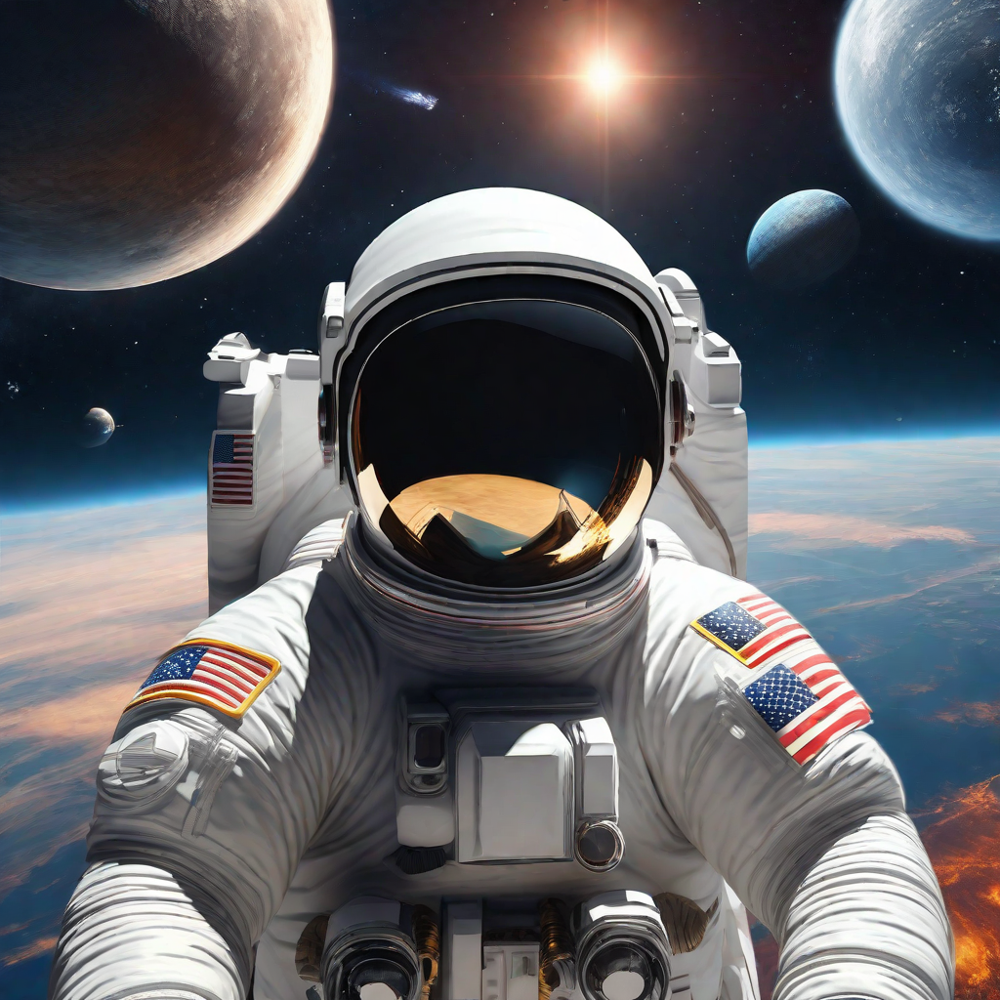

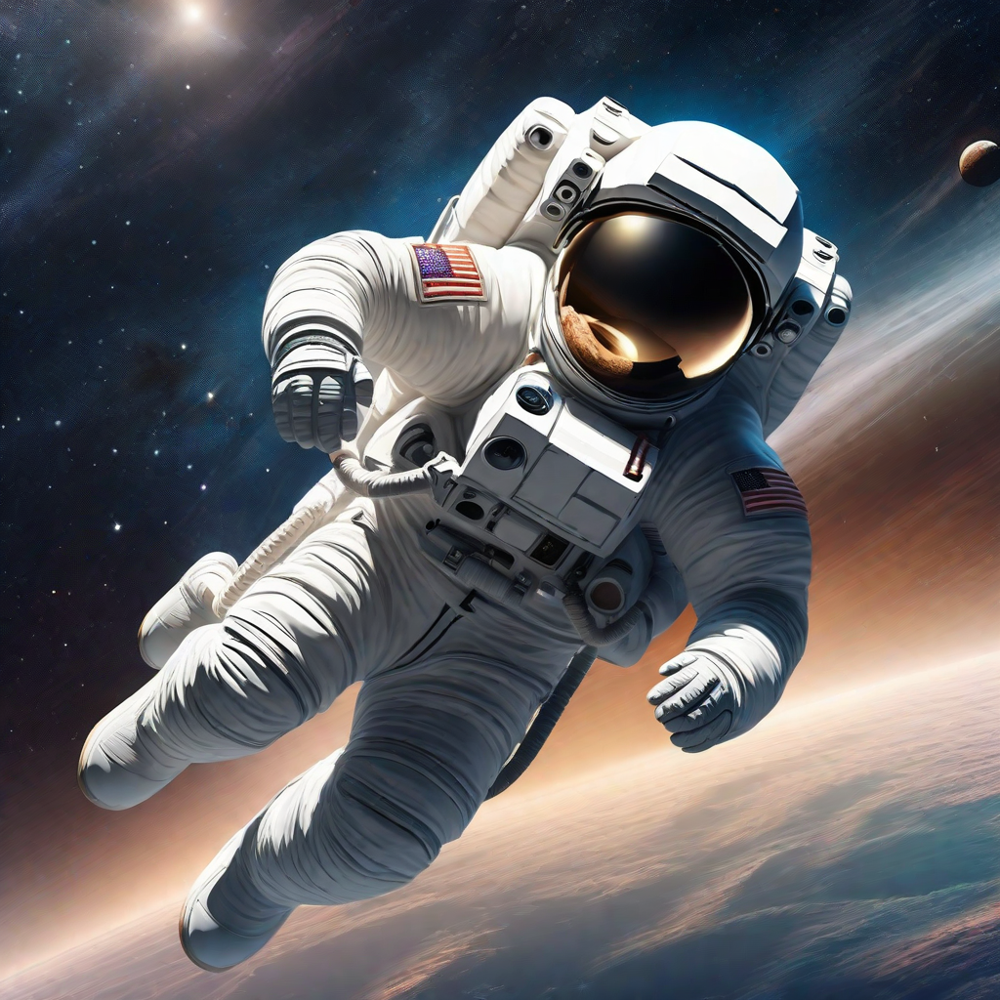

In [24]:
t2i = pipe.text2img(
    prompt=prompt,
    negative_prompt=negative_prompt,
    num_inference_steps=20,
    guidance_scale=8.0,
    num_images_per_prompt=2,
    height=1024,
    width=1024,
).images
for img in t2i:
    display(img)

  0%|          | 0/16 [00:00<?, ?it/s]

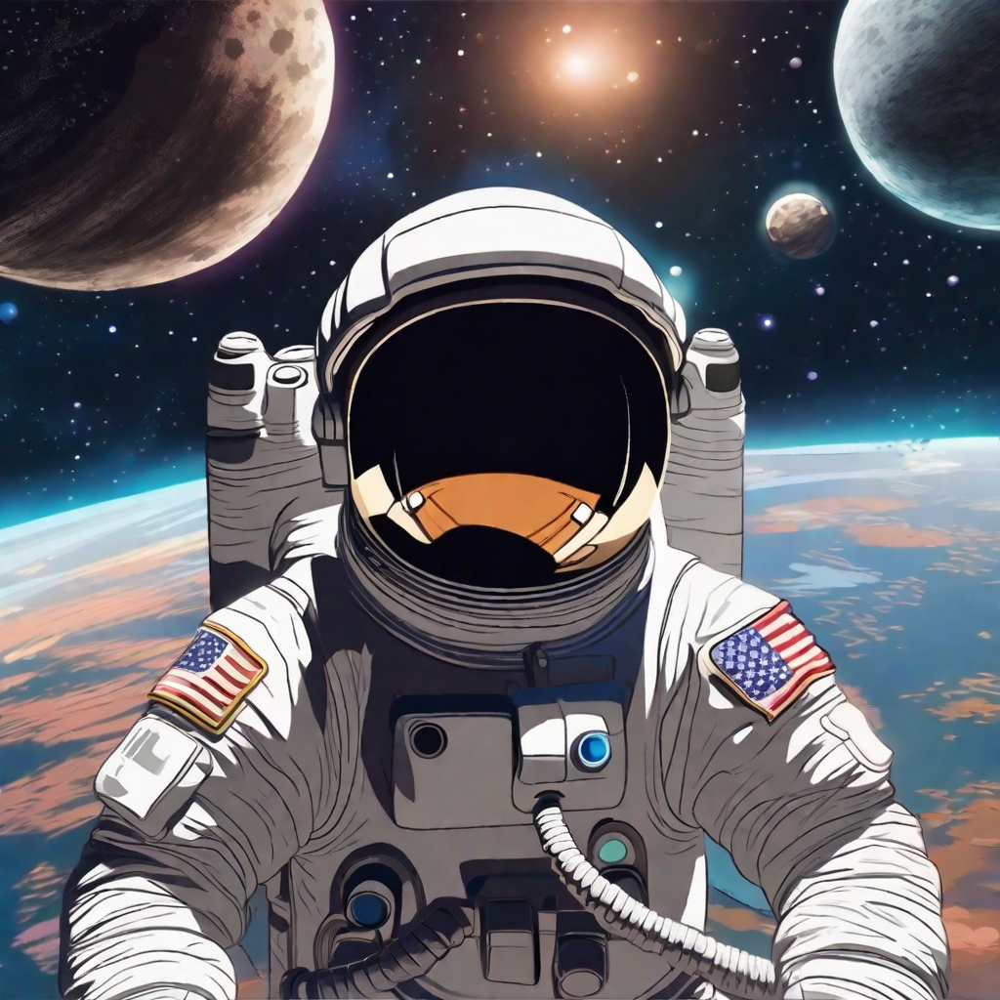

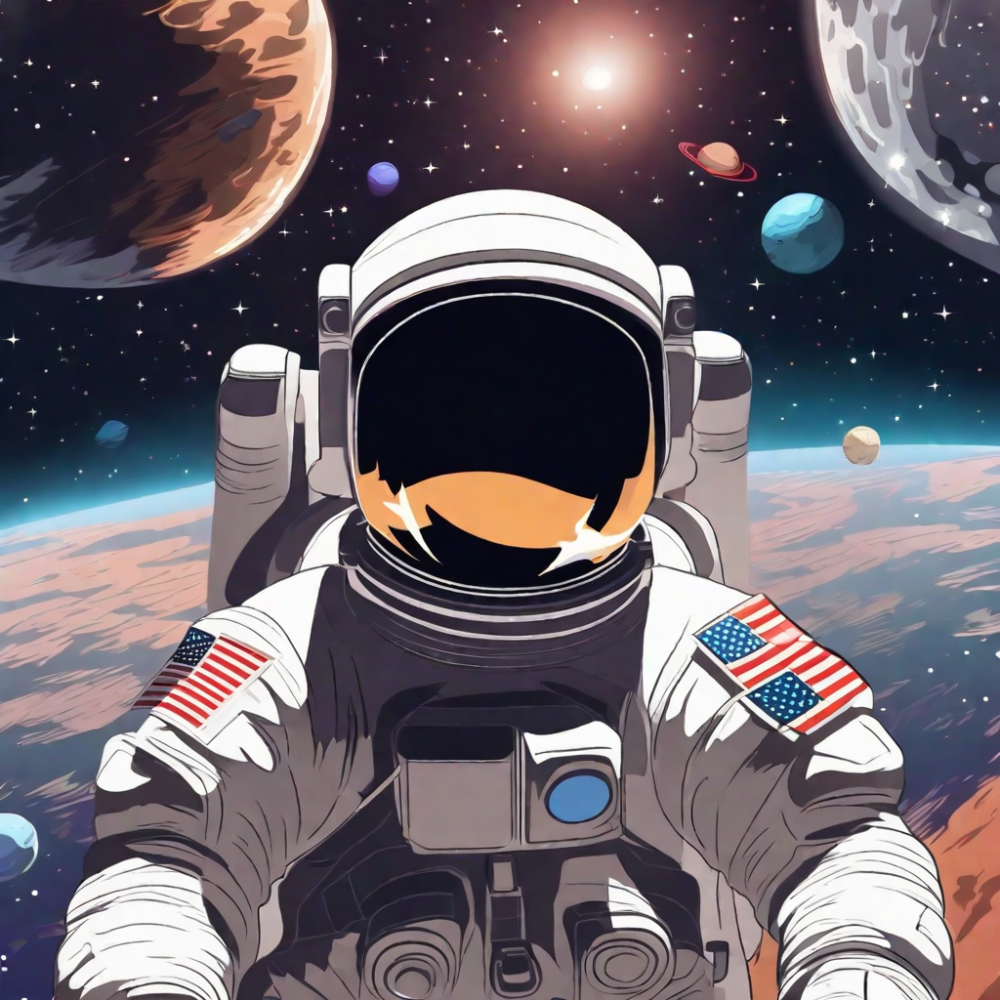

In [25]:
i2i = pipe.img2img(
    image=t2i[0],
    prompt="An astronaut floating in space, (cartoon:1.5)",
    negative_prompt=negative_prompt,
    strength=0.8,
    num_inference_steps=20,
    guidance_scale=10.0,
    num_images_per_prompt=2,
    height=1024,
    width=1024,
).images
for img in i2i:
    display(img)

In [26]:
from diffusers.utils import load_image

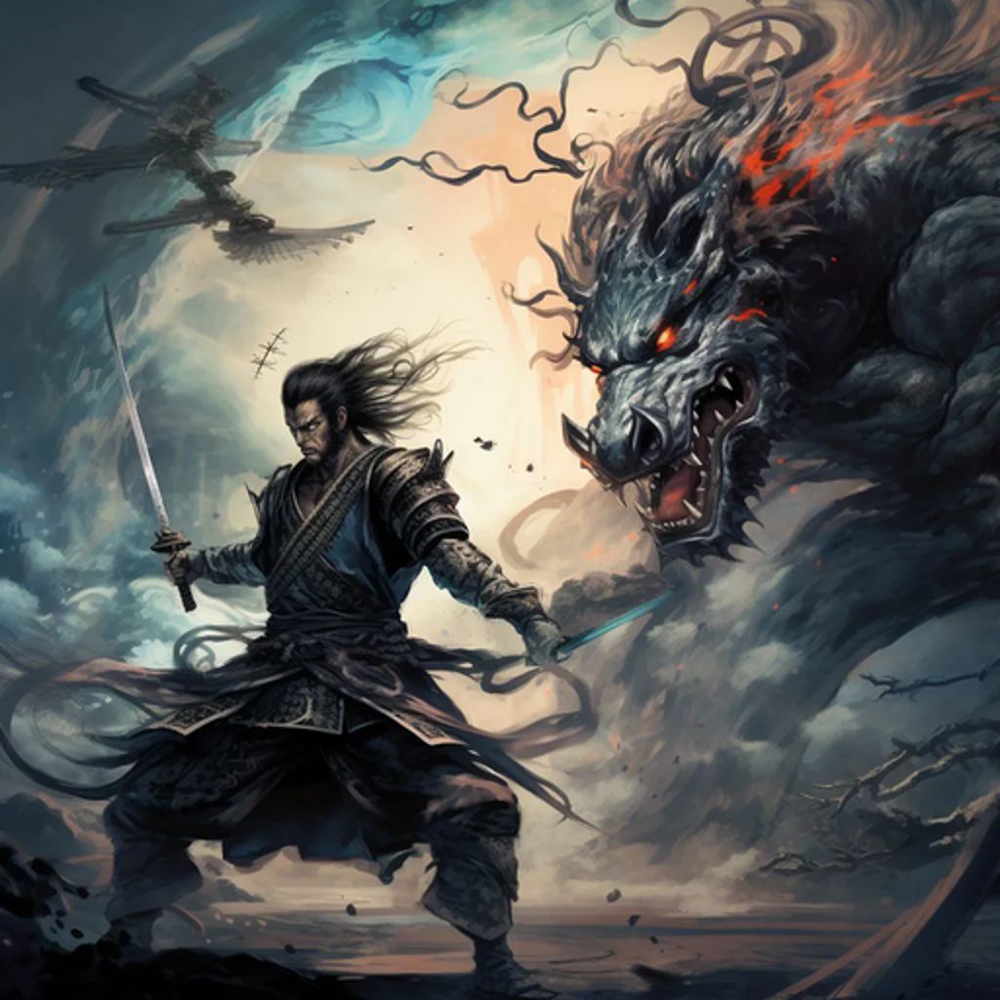

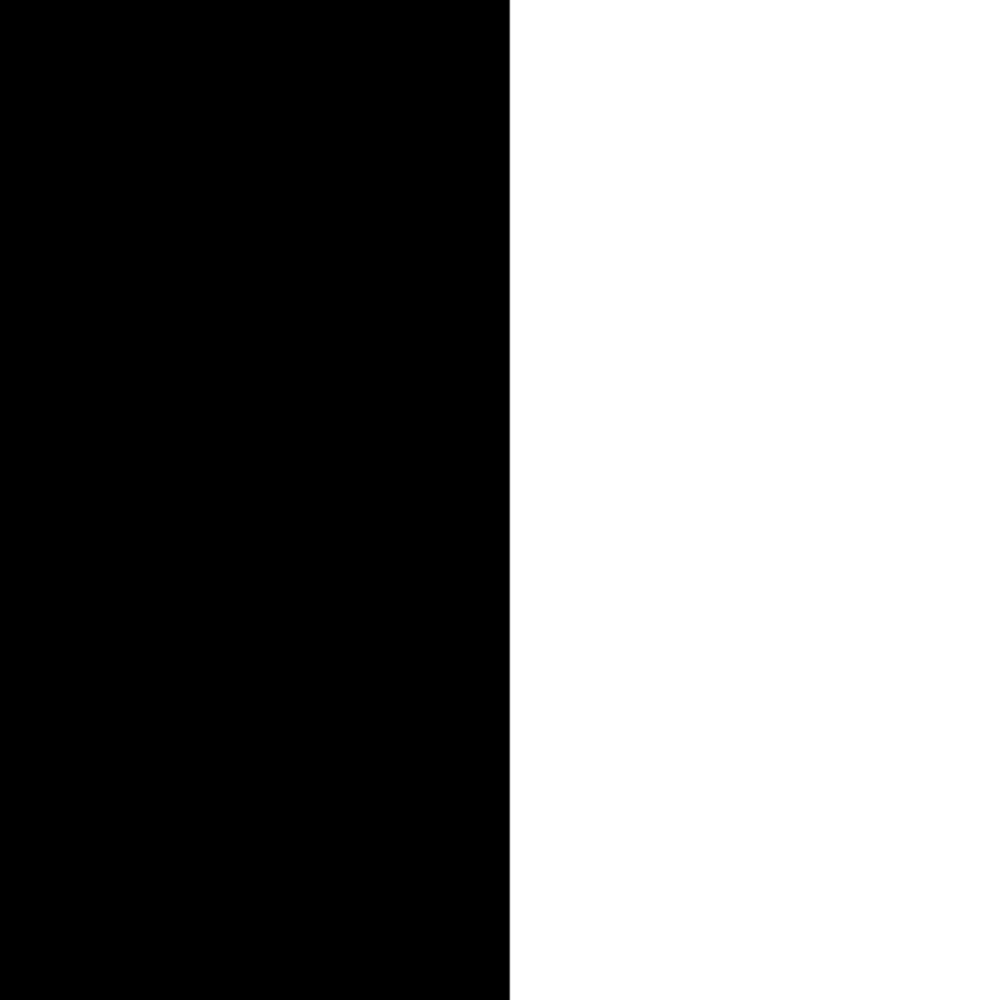

In [27]:
img_url = "https://private-user-images.githubusercontent.com/72266394/267230073-1cc2c825-8c3b-4015-8e17-aef1690fd12c.png?jwt=eyJhbGciOiJIUzI1NiIsInR5cCI6IkpXVCJ9.eyJpc3MiOiJnaXRodWIuY29tIiwiYXVkIjoicmF3LmdpdGh1YnVzZXJjb250ZW50LmNvbSIsImtleSI6ImtleTEiLCJleHAiOjE3MDE2OTg4MzIsIm5iZiI6MTcwMTY5ODUzMiwicGF0aCI6Ii83MjI2NjM5NC8yNjcyMzAwNzMtMWNjMmM4MjUtOGMzYi00MDE1LThlMTctYWVmMTY5MGZkMTJjLnBuZz9YLUFtei1BbGdvcml0aG09QVdTNC1ITUFDLVNIQTI1NiZYLUFtei1DcmVkZW50aWFsPUFLSUFJV05KWUFYNENTVkVINTNBJTJGMjAyMzEyMDQlMkZ1cy1lYXN0LTElMkZzMyUyRmF3czRfcmVxdWVzdCZYLUFtei1EYXRlPTIwMjMxMjA0VDE0MDIxMlomWC1BbXotRXhwaXJlcz0zMDAmWC1BbXotU2lnbmF0dXJlPTFiMGE1MmViYzAzNDY0ZmYxNDNmOTBhODQyYjZjMzBlNDY4M2NkOGZlNGIyODAyMmVlNDZlNDE3ZmExMDU0YmEmWC1BbXotU2lnbmVkSGVhZGVycz1ob3N0JmFjdG9yX2lkPTAma2V5X2lkPTAmcmVwb19pZD0wIn0.DHRqdnQ-L_FL6yLXiaGUx21EquSogRJwpyfDx_LDCGA"
mask_url = "https://private-user-images.githubusercontent.com/72266394/267230091-eb5292f3-a28a-4160-b700-1a9c380797ab.png?jwt=eyJhbGciOiJIUzI1NiIsInR5cCI6IkpXVCJ9.eyJpc3MiOiJnaXRodWIuY29tIiwiYXVkIjoicmF3LmdpdGh1YnVzZXJjb250ZW50LmNvbSIsImtleSI6ImtleTEiLCJleHAiOjE3MDE2OTg4MzIsIm5iZiI6MTcwMTY5ODUzMiwicGF0aCI6Ii83MjI2NjM5NC8yNjcyMzAwOTEtZWI1MjkyZjMtYTI4YS00MTYwLWI3MDAtMWE5YzM4MDc5N2FiLnBuZz9YLUFtei1BbGdvcml0aG09QVdTNC1ITUFDLVNIQTI1NiZYLUFtei1DcmVkZW50aWFsPUFLSUFJV05KWUFYNENTVkVINTNBJTJGMjAyMzEyMDQlMkZ1cy1lYXN0LTElMkZzMyUyRmF3czRfcmVxdWVzdCZYLUFtei1EYXRlPTIwMjMxMjA0VDE0MDIxMlomWC1BbXotRXhwaXJlcz0zMDAmWC1BbXotU2lnbmF0dXJlPWZlZmVhNjBkZDVhN2I0M2RkMmU2OTRhNzc4N2E0NDg2ZWE0ZmJmMjBhMTYyNzg5ZGY0YTMyM2I5MGZkZWNiOTcmWC1BbXotU2lnbmVkSGVhZGVycz1ob3N0JmFjdG9yX2lkPTAma2V5X2lkPTAmcmVwb19pZD0wIn0.FCG-o2Z-YxkCGD-nANpJiqAu-b5GzxW1glwOlVGJ8TU"
image = load_image(img_url).resize((1024, 1024))
mask_image = load_image(mask_url).resize((1024, 1024))
display(image)
display(mask_image)

  0%|          | 0/16 [00:00<?, ?it/s]

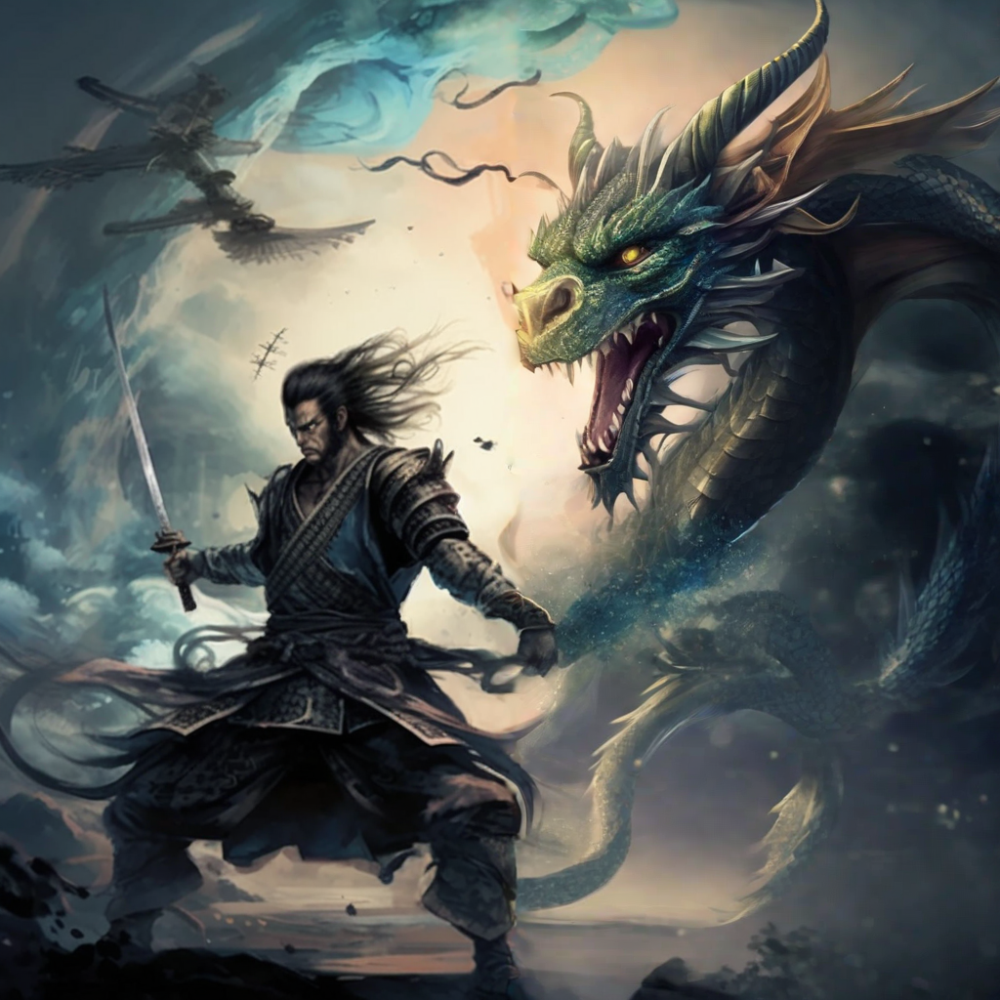

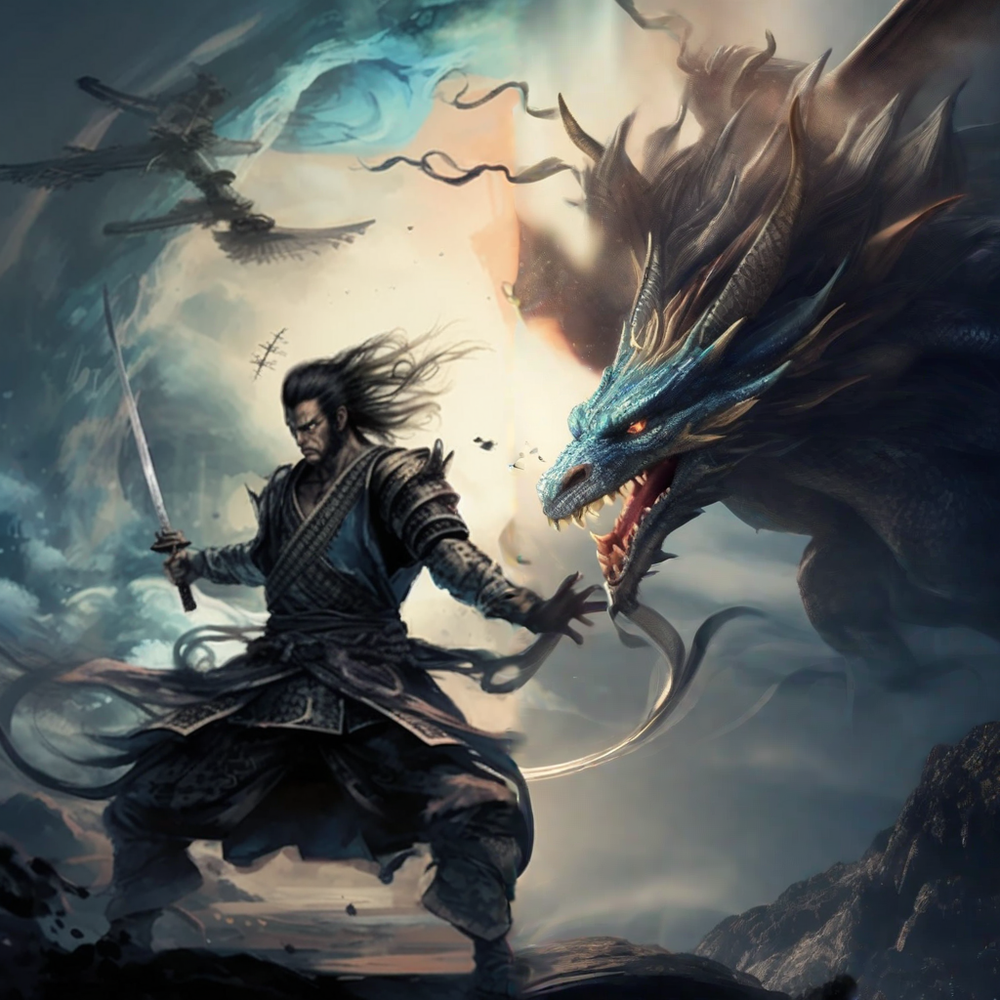

In [30]:
inp = pipe.inpaint(
    prompt="Digital illustration of an (mythical:1.5) ((dragon:1.2))-like creature, high quality, realistic, 8k",
    image=image,
    mask_image=mask_image,
    guidance_scale=6.0,
    num_inference_steps=20,
    strength=0.8,
    num_images_per_prompt=2,
).images
for img in inp:
    display(img)